# Slow-Mode Array Plot Recreation

Standalone notebook that loads **saved slow-mode arrays** from notebook 00 and
recreates every section-6 plot, **side-by-side** for both the
`with_low_occupancy_cutoff` and `without_low_occupancy_cutoff` views.

No re-fitting of transfer operators or G-PCCA is required — all arrays are
loaded directly from disk.

**Outputs produced:**
1. Eigenvalue spectra (both views)
2. Native-eigenspace GPCCA arm scatter (3-D + 2-D)
3. Shared-eigenspace GPCCA arm scatter (3-D + 2-D)
4. Global-cluster N = 1,000 contribution view
5. Cosine-similarity matrix of matched arm vectors
6. Per-arm cloud plots (species coloured)
7. UMAP density & log₂ enrichment panels
8. MoSeq syllable heatmaps per matched arm

## 1. Imports and Paths

In [14]:
from pathlib import Path
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker
from mpl_toolkits.mplot3d import Axes3D          # noqa: F401
from scipy.ndimage import gaussian_filter
from scipy.cluster.hierarchy import dendrogram, leaves_list, linkage
from scipy.spatial.distance import squareform
from scipy.optimize import linear_sum_assignment
import warnings
warnings.filterwarnings("ignore")

# ── Edit this one line to point at your run root ──────────────────────────
RUN_ROOT = Path(
    "/Users/meganbishop/slowmodeevo/outputs/"
    "multispecies_slow_modes/global_clustering_modes/"
    "global_outputs/XY_EvenSampled_SlowModes"
)

EXPORT_ROOT = RUN_ROOT / "saved_slow_mode_arrays"
VIEWS = ["with_low_occupancy_cutoff", "without_low_occupancy_cutoff"]
VIEW_LABELS = {
    "with_low_occupancy_cutoff":    "With occupancy cutoff",
    "without_low_occupancy_cutoff": "Without occupancy cutoff",
}

# ── Plotting defaults ─────────────────────────────────────────────────────
DIMS_3D        = 3          # number of phi dimensions to use for 3-D plots
N_BASINS       = 2          # adjust if you used a different M
DENSITY_BINS   = 90
DENSITY_SIGMA  = 1.25
DENSITY_VMAX_P = 99.5       # percentile for density colour-scale cap
ENRICH_VMAX    = 2.5        # log2 enrichment colour-scale limit
EPS            = 1e-10

print(f"RUN_ROOT: {RUN_ROOT}")
print(f"EXPORT_ROOT exists: {EXPORT_ROOT.exists()}")


RUN_ROOT: /Users/meganbishop/slowmodeevo/outputs/multispecies_slow_modes/global_clustering_modes/global_outputs/XY_EvenSampled_SlowModes
EXPORT_ROOT exists: True


## 2. Load Saved Arrays

In [15]:
def load_view(view: str) -> dict:
    """
    Load all saved arrays for one view.  Returns a dict keyed by species,
    each value a dict of array name → numpy array.
    """
    view_dir = EXPORT_ROOT / view
    if not view_dir.exists():
        raise FileNotFoundError(f"View directory not found: {view_dir}")
    result = {}
    for species_dir in sorted(view_dir.iterdir()):
        if not species_dir.is_dir():
            continue
        species = species_dir.name
        arrays = {}
        for f in species_dir.glob("*.npy"):
            arrays[f.stem] = np.load(f, allow_pickle=False)
        result[species] = arrays
    return result


def load_reference_axes() -> dict:
    ref_dir = EXPORT_ROOT / "pooled_full_reference_axes"
    return {f.stem: np.load(f, allow_pickle=False) for f in sorted(ref_dir.glob("*.npy"))}


views = {v: load_view(v) for v in VIEWS}
reference = load_reference_axes()

# Species list (same across both views)
species_names = sorted(next(iter(views.values())).keys())
print(f"Species ({len(species_names)}): {species_names}")

# Discover N_BASINS from saved chi shapes
n_basins_detected = int(next(iter(views["with_low_occupancy_cutoff"].values()))["chi_macro_aligned"].shape[1])
if n_basins_detected != N_BASINS:
    print(f"Note: detected N_BASINS={n_basins_detected} from saved chi; updating.")
    N_BASINS = n_basins_detected

print(f"N_BASINS = {N_BASINS}")


Species (8): ['Mus_caroli', 'Mus_musculus', 'Mus_spretus', 'Peromyscus_californicus', 'Peromyscus_gossypinus', 'Peromyscus_leucopus', 'Peromyscus_maniculatus', 'Peromyscus_polionotus']
N_BASINS = 2


In [3]:
# Colour setup
species_cmap   = plt.get_cmap("tab10")
species_colors = {sp: species_cmap(i / max(len(species_names) - 1, 1))
                  for i, sp in enumerate(species_names)}

arm_cmap   = plt.get_cmap("Set2")
arm_colors = [arm_cmap(i / max(N_BASINS - 1, 1)) for i in range(N_BASINS)]

# Load cluster-centre UMAP embedding (N_global × 2)
embedding_csv = RUN_ROOT / "global_cluster_embedding.csv"
cluster_layout_2d = None
if embedding_csv.exists():
    emb = pd.read_csv(embedding_csv)
    x_cols = [c for c in emb.columns if c.lower() in ("x", "umap1", "umap_1", "umap 1", "dim1", "dim_1", "0")]
    y_cols = [c for c in emb.columns if c.lower() in ("y", "umap2", "umap_2", "umap 2", "dim2", "dim_2", "1")]
    if x_cols and y_cols:
        xy_cols = [x_cols[0], y_cols[0]]
    elif len(emb.columns) >= 2:
        xy_cols = [emb.columns[0], emb.columns[1]]
        print(f"  Falling back to first two columns: {xy_cols}")
    cluster_layout_2d = emb[xy_cols].values
    print(f"Cluster layout loaded: {cluster_layout_2d.shape}")
else:
    print("global_cluster_embedding.csv not found; UMAP panels will be skipped.")

# Load MoSeq syllable probs (optional)
moseq_csv = RUN_ROOT / "matched_arm_syllable_probs.csv"
moseq_probs = pd.read_csv(moseq_csv) if moseq_csv.exists() else None
print(f"MoSeq syllable probs: {'loaded' if moseq_probs is not None else 'not found'}")


Cluster layout loaded: (1000, 2)
MoSeq syllable probs: loaded


## 3. Shared Plot Helpers

In [4]:
def set_equal_3d_limits(ax, pts, pad=0.08):
    pts = np.asarray(pts, dtype=float)
    pts = pts[np.isfinite(pts).all(axis=1)]
    if pts.size == 0:
        return
    lo, hi = pts.min(0), pts.max(0)
    ctr = 0.5 * (lo + hi)
    r = 0.5 * max(np.max(hi - lo), 1e-12) * (1 + pad)
    ax.set_xlim(ctr[0] - r, ctr[0] + r)
    ax.set_ylim(ctr[1] - r, ctr[1] + r)
    ax.set_zlim(ctr[2] - r, ctr[2] + r)


def normalise_rows(X):
    X = np.asarray(X, dtype=float)
    norms = np.linalg.norm(X, axis=1, keepdims=True)
    norms[norms == 0] = 1.0
    return X / norms


def cosine_similarity_matrix(A, B):
    return normalise_rows(A) @ normalise_rows(B).T


def arm_centroid_in_space(phi, chi, pi):
    """pi-weighted chi centroid for each arm in phi-space."""
    phi = np.asarray(phi, dtype=float)
    chi = np.asarray(chi, dtype=float)
    pi  = np.asarray(pi,  dtype=float)
    pi  = pi / max(pi.sum(), 1e-12)
    centroids = np.zeros((chi.shape[1], phi.shape[1]))
    for arm in range(chi.shape[1]):
        w = chi[:, arm] * pi
        w_sum = w.sum()
        centroids[arm] = (phi * w[:, None]).sum(0) / max(w_sum, 1e-12)
    return centroids


def plot_eigenvalue_spectra(views_dict, title_prefix=""):
    """Compare leading eigenvalue magnitudes across views and species."""
    n_sp  = len(species_names)
    n_v   = len(VIEWS)
    fig, axes = plt.subplots(n_sp, n_v,
                             figsize=(4.5 * n_v, 2.8 * n_sp),
                             constrained_layout=True, squeeze=False)
    for col, view in enumerate(VIEWS):
        for row, species in enumerate(species_names):
            ax  = axes[row, col]
            ev  = np.abs(views_dict[view][species]["evals"])
            ax.stem(np.arange(1, len(ev) + 1), ev, basefmt=" ")
            ax.axhline(1.0, color="k", lw=0.6, ls="--")
            if row == 0:
                ax.set_title(VIEW_LABELS[view], fontsize=9)
            ax.set_ylabel(species.replace("_", " "), fontsize=7)
            ax.set_xlabel("eigenvalue index" if row == n_sp - 1 else "")
            ax.tick_params(labelsize=7)
    fig.suptitle(f"{title_prefix}Leading eigenvalue magnitudes")
    plt.show()
    return fig


## 4. Eigenvalue Spectra

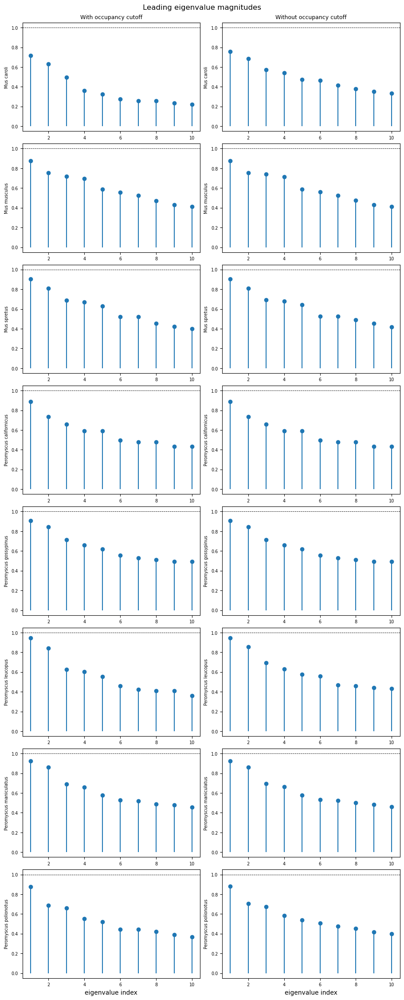

In [5]:
fig_evals = plot_eigenvalue_spectra(views)


## 5. Native-Eigenspace GPCCA Arm Scatter

Each panel shows the macro-cluster cloud in its **own** (species-specific) slow-eigenspace
(φ₂, φ₃, φ₄), coloured by Hungarian-aligned arm. Point size scales with
`macro_occupancy`.

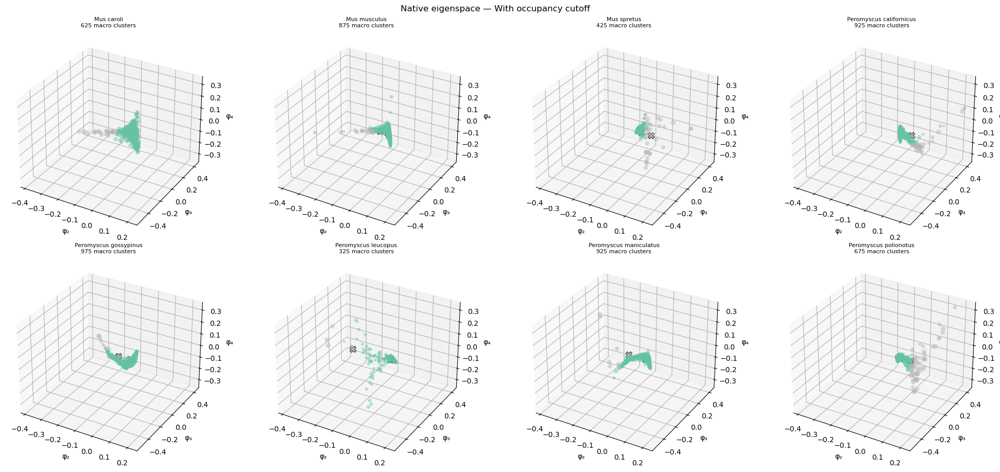

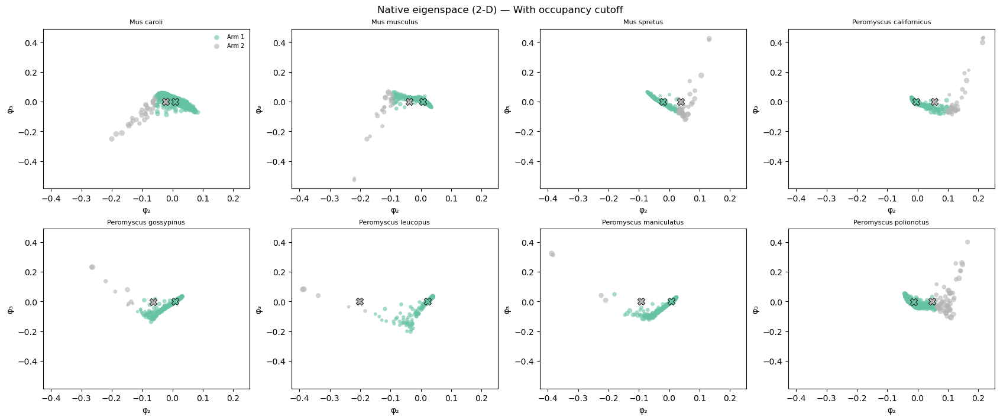

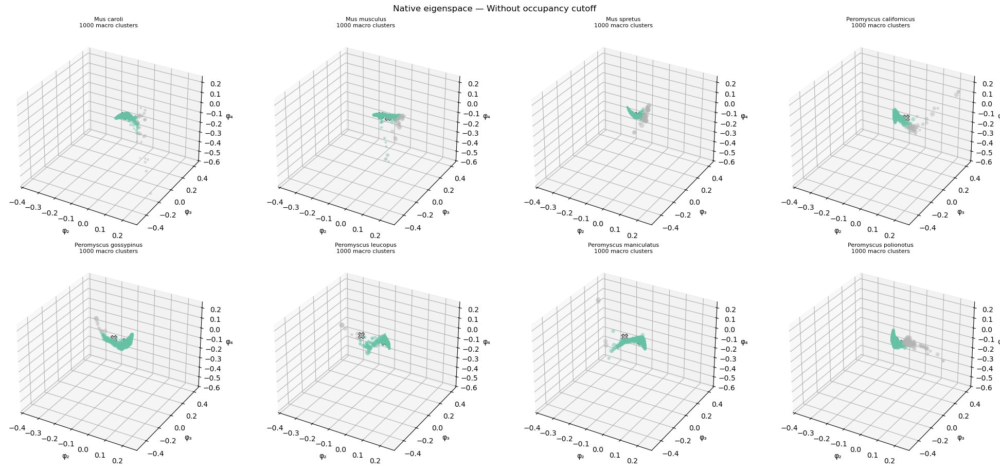

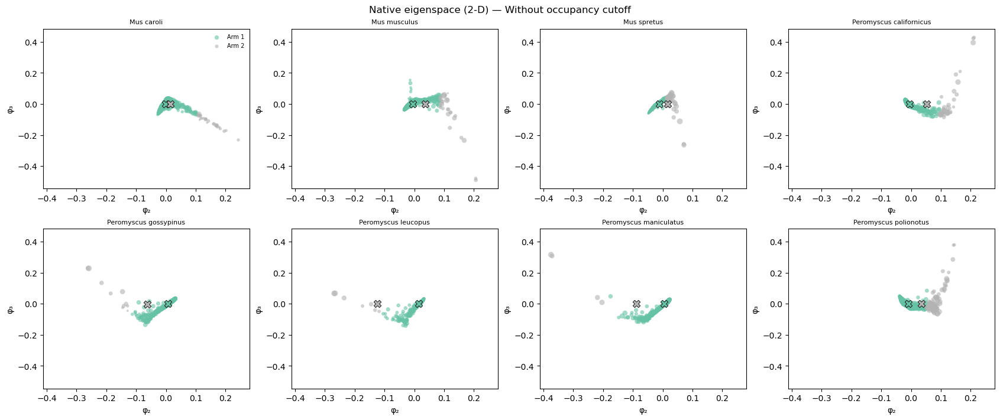

In [6]:
def plot_native_eigenspace(view: str, coords_key: str = "phi_macro_native",
                            arms_key: str = "arm_assignments_macro_aligned",
                            occ_key: str = "macro_occupancy"):
    arrs  = views[view]
    n_sp  = len(species_names)
    n_cols = min(4, n_sp)
    n_rows = int(np.ceil(n_sp / n_cols))

    fig3 = plt.figure(figsize=(5 * n_cols, 4.5 * n_rows), constrained_layout=True)
    fig2, axes2 = plt.subplots(n_rows, n_cols,
                               figsize=(4.2 * n_cols, 3.5 * n_rows),
                               constrained_layout=True, squeeze=False)

    # Compute common 3-D limits across all species for this view
    all_pts = []
    for sp in species_names:
        phi = arrs[sp].get(coords_key)
        if phi is not None and phi.shape[1] >= 3:
            all_pts.append(phi[:, :3])
    all_pts = np.vstack(all_pts) if all_pts else np.zeros((1, 3))
    all_pts = all_pts[np.isfinite(all_pts).all(1)]
    lo, hi = all_pts.min(0), all_pts.max(0)
    pad = 0.06 * np.maximum(hi - lo, 1e-12)
    lims = [(lo[d] - pad[d], hi[d] + pad[d]) for d in range(3)]

    for idx, sp in enumerate(species_names, 1):
        d    = arrs[sp]
        phi  = d.get(coords_key)
        arms = d.get(arms_key)
        occ  = d.get(occ_key)
        ax3  = fig3.add_subplot(n_rows, n_cols, idx, projection="3d")
        ax2  = axes2.flat[idx - 1]
        if phi is None or phi.shape[1] < 3 or arms is None:
            ax3.set_title(f"{sp}\nno data"); ax2.set_title(f"{sp}\nno data")
            continue
        occ  = occ / max(occ.sum(), 1e-12) if occ is not None else np.ones(len(phi)) / len(phi)
        sizes = 6 + 44 * np.sqrt(occ / max(occ.max(), 1e-12))
        for arm in range(N_BASINS):
            mask = (arms == arm) & np.isfinite(phi[:, :3]).all(1) & (occ > 0)
            if not mask.any():
                continue
            ax3.scatter(*phi[mask, :3].T, s=sizes[mask], color=arm_colors[arm], alpha=0.45, linewidths=0, label=f"Arm {arm+1}")
            ax2.scatter(phi[mask, 0], phi[mask, 1], s=sizes[mask], color=arm_colors[arm], alpha=0.6, linewidths=0, label=f"Arm {arm+1}")
        # arm centroids
        chi = d.get("chi_macro_aligned")
        pi  = d.get("pi_macro")
        if chi is not None and pi is not None:
            ctrs = arm_centroid_in_space(phi[:, :3], chi, pi)
            for arm, ctr in enumerate(ctrs):
                ax3.scatter(*ctr, s=80, marker="X", color=arm_colors[arm], edgecolors="k", linewidths=0.6, zorder=5)
                ax2.scatter(ctr[0], ctr[1], s=80, marker="X", color=arm_colors[arm], edgecolors="k", linewidths=0.6, zorder=5)
        ax3.set_xlim(*lims[0]); ax3.set_ylim(*lims[1]); ax3.set_zlim(*lims[2])
        ax2.set_xlim(*lims[0]); ax2.set_ylim(*lims[1])
        ax3.set_xlabel("φ₂"); ax3.set_ylabel("φ₃"); ax3.set_zlabel("φ₄")
        ax2.set_xlabel("φ₂"); ax2.set_ylabel("φ₃")
        ax3.set_title(f"{sp.replace('_',' ')}\n{d[coords_key].shape[0]} macro clusters", fontsize=8)
        ax2.set_title(f"{sp.replace('_',' ')}", fontsize=8)
        if idx == 1:
            ax2.legend(fontsize=7, frameon=False)

    fig3.suptitle(f"Native eigenspace — {VIEW_LABELS[view]}")
    fig2.suptitle(f"Native eigenspace (2-D) — {VIEW_LABELS[view]}")
    plt.show()
    return fig3, fig2

for view in VIEWS:
    plot_native_eigenspace(view)


## 6. Shared-Eigenspace GPCCA Arm Scatter

Macro-clusters projected into the **pooled reference eigenspace** (φ₂, φ₃, φ₄).
Common axis limits are enforced across both views and all species.

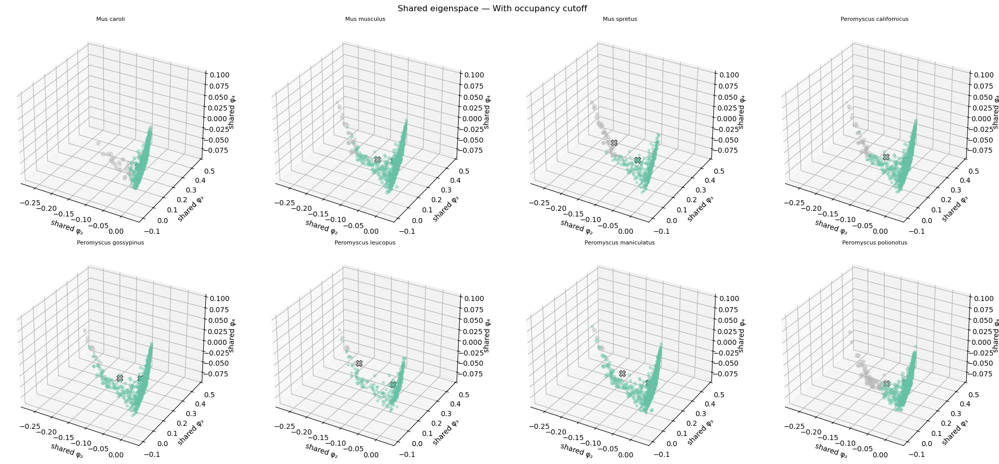

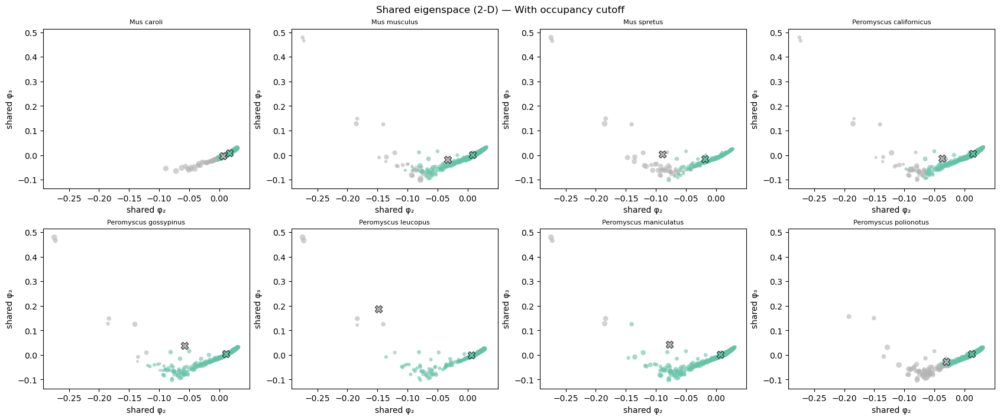

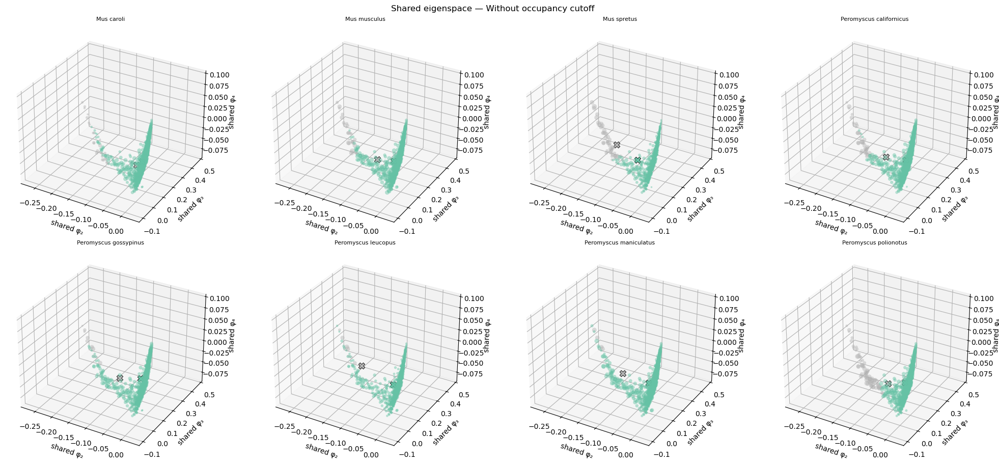

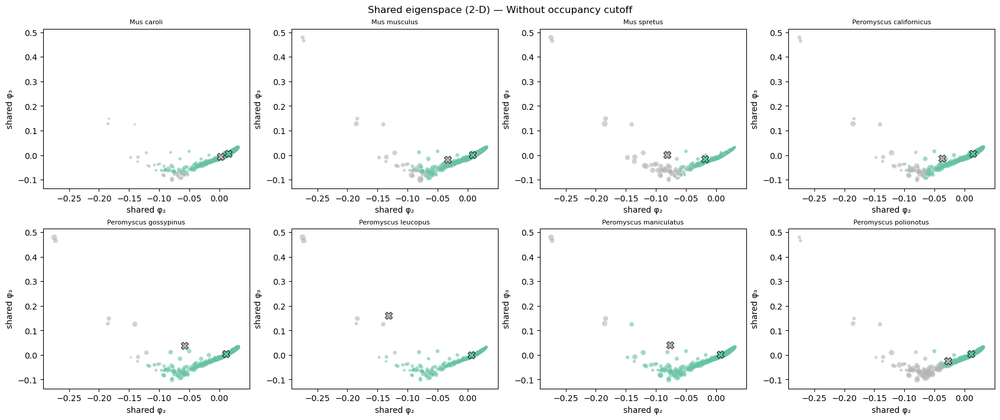

In [7]:
def plot_shared_eigenspace(view: str, coords_key: str = "phi_macro_shared",
                            arms_key: str = "arm_assignments_macro_aligned",
                            occ_key: str = "macro_occupancy"):
    arrs  = views[view]
    n_sp  = len(species_names)
    n_cols = min(4, n_sp)
    n_rows = int(np.ceil(n_sp / n_cols))

    all_pts = []
    for sp in species_names:
        phi = arrs[sp].get(coords_key)
        if phi is not None and phi.shape[1] >= 3:
            all_pts.append(phi[:, :3])
    all_pts = np.vstack(all_pts) if all_pts else np.zeros((1, 3))
    all_pts = all_pts[np.isfinite(all_pts).all(1)]
    lo, hi = all_pts.min(0), all_pts.max(0)
    pad = 0.06 * np.maximum(hi - lo, 1e-12)
    lims = [(lo[d] - pad[d], hi[d] + pad[d]) for d in range(3)]

    fig3 = plt.figure(figsize=(5 * n_cols, 4.5 * n_rows), constrained_layout=True)
    fig2, axes2 = plt.subplots(n_rows, n_cols,
                               figsize=(4.2 * n_cols, 3.5 * n_rows),
                               constrained_layout=True, squeeze=False)

    for idx, sp in enumerate(species_names, 1):
        d    = arrs[sp]
        phi  = d.get(coords_key)
        arms = d.get(arms_key)
        occ  = d.get(occ_key)
        ax3  = fig3.add_subplot(n_rows, n_cols, idx, projection="3d")
        ax2  = axes2.flat[idx - 1]
        if phi is None or phi.shape[1] < 3 or arms is None:
            ax3.set_title(f"{sp}\nno data"); ax2.set_title(f"{sp}\nno data")
            continue
        occ  = occ / max(occ.sum(), 1e-12) if occ is not None else np.ones(len(phi)) / len(phi)
        sizes = 6 + 44 * np.sqrt(occ / max(occ.max(), 1e-12))
        for arm in range(N_BASINS):
            mask = (arms == arm) & np.isfinite(phi[:, :3]).all(1) & (occ > 0)
            if not mask.any():
                continue
            ax3.scatter(*phi[mask, :3].T, s=sizes[mask], color=arm_colors[arm], alpha=0.45, linewidths=0, label=f"Arm {arm+1}")
            ax2.scatter(phi[mask, 0], phi[mask, 1], s=sizes[mask], color=arm_colors[arm], alpha=0.6, linewidths=0)
        chi = d.get("chi_macro_aligned"); pi = d.get("pi_macro")
        if chi is not None and pi is not None:
            ctrs = arm_centroid_in_space(phi[:, :3], chi, pi)
            for arm, ctr in enumerate(ctrs):
                ax3.scatter(*ctr, s=80, marker="X", color=arm_colors[arm], edgecolors="k", linewidths=0.6, zorder=5)
                ax2.scatter(ctr[0], ctr[1], s=80, marker="X", color=arm_colors[arm], edgecolors="k", linewidths=0.6, zorder=5)
        ax3.set_xlim(*lims[0]); ax3.set_ylim(*lims[1]); ax3.set_zlim(*lims[2])
        ax2.set_xlim(*lims[0]); ax2.set_ylim(*lims[1])
        ax3.set_xlabel("shared φ₂"); ax3.set_ylabel("shared φ₃"); ax3.set_zlabel("shared φ₄")
        ax2.set_xlabel("shared φ₂"); ax2.set_ylabel("shared φ₃")
        ax3.set_title(f"{sp.replace('_',' ')}", fontsize=8)
        ax2.set_title(f"{sp.replace('_',' ')}", fontsize=8)
    fig3.suptitle(f"Shared eigenspace — {VIEW_LABELS[view]}")
    fig2.suptitle(f"Shared eigenspace (2-D) — {VIEW_LABELS[view]}")
    plt.show()
    return fig3, fig2

for view in VIEWS:
    plot_shared_eigenspace(view)


## 7. Global-Cluster N = 1,000 Contribution View

All 1,000 original global clusters coloured by their Hungarian-aligned arm
(`arm_assignments_global_aligned`), plotted in the shared-eigenspace coordinates
lifted back to the original cluster level (`phi_global_shared`).

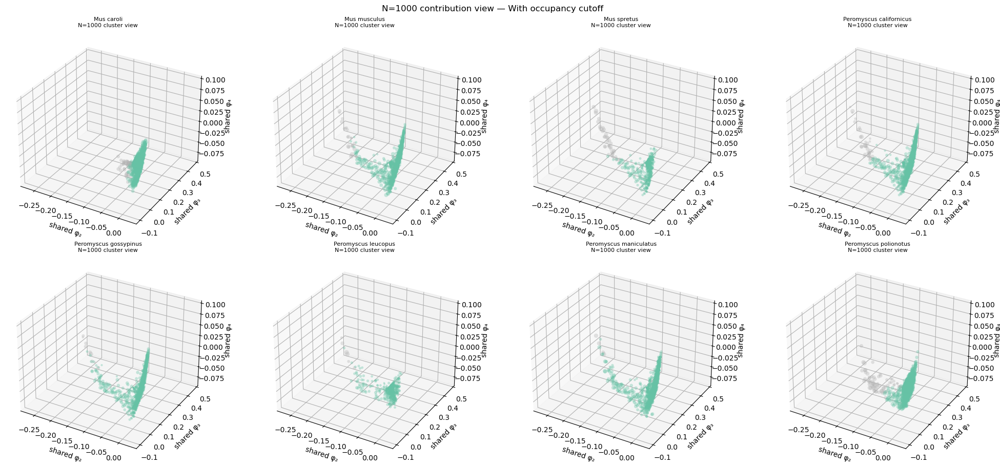

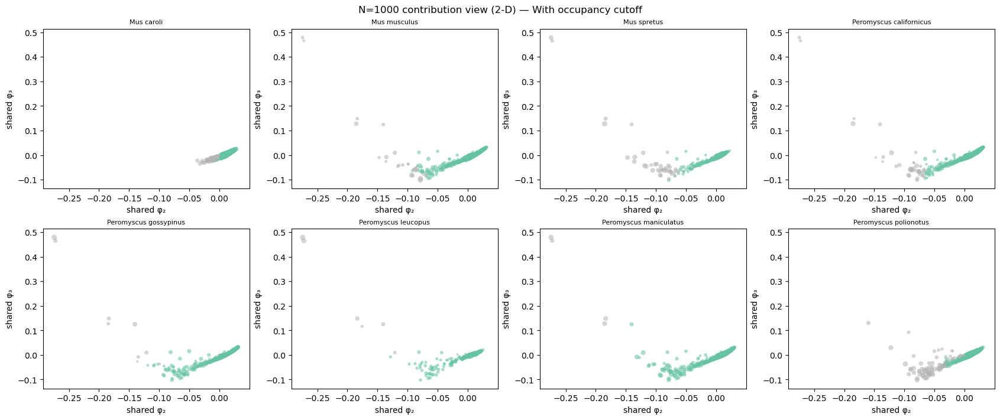

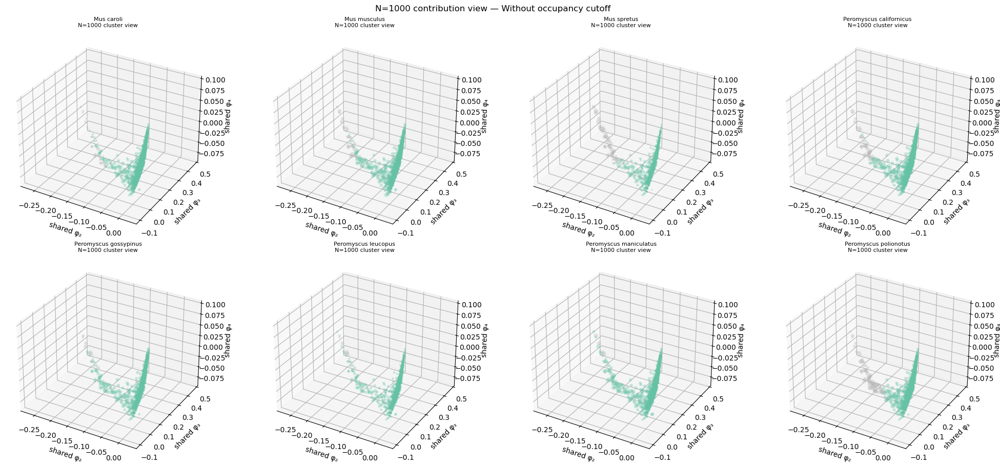

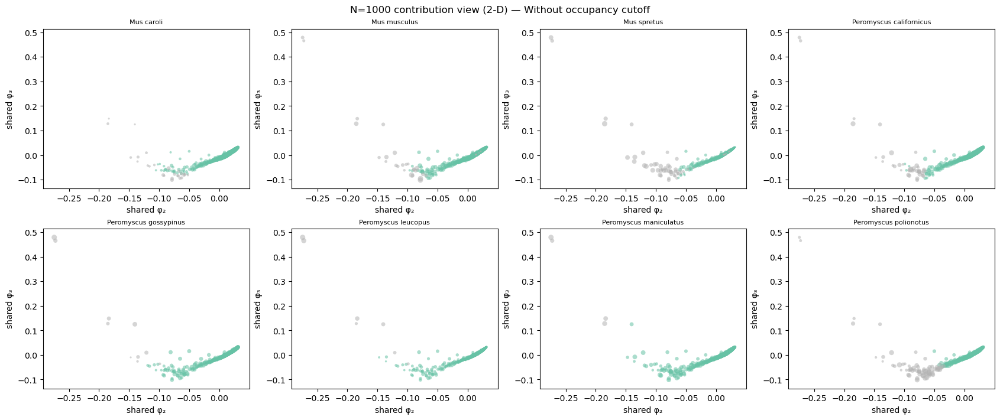

In [8]:
def plot_global_contribution_view(view: str):
    arrs  = views[view]
    n_sp  = len(species_names)
    n_cols = min(4, n_sp)
    n_rows = int(np.ceil(n_sp / n_cols))

    all_pts = []
    for sp in species_names:
        phi = arrs[sp].get("phi_global_shared")
        if phi is not None and phi.shape[1] >= 3:
            all_pts.append(phi[:, :3])
    all_pts = np.vstack(all_pts) if all_pts else np.zeros((1, 3))
    all_pts = all_pts[np.isfinite(all_pts).all(1)]
    lo, hi = all_pts.min(0), all_pts.max(0)
    pad = 0.06 * np.maximum(hi - lo, 1e-12)
    lims = [(lo[d] - pad[d], hi[d] + pad[d]) for d in range(3)]

    fig3 = plt.figure(figsize=(5 * n_cols, 4.5 * n_rows), constrained_layout=True)
    fig2, axes2 = plt.subplots(n_rows, n_cols,
                               figsize=(4.2 * n_cols, 3.5 * n_rows),
                               constrained_layout=True, squeeze=False)

    for idx, sp in enumerate(species_names, 1):
        d    = arrs[sp]
        phi  = d.get("phi_global_shared")
        arms = d.get("arm_assignments_global_aligned")
        occ  = d.get("occupancy_global")
        ax3  = fig3.add_subplot(n_rows, n_cols, idx, projection="3d")
        ax2  = axes2.flat[idx - 1]
        if phi is None or phi.shape[1] < 3 or arms is None:
            ax3.set_title(f"{sp}\nno data"); ax2.set_title(f"{sp}\nno data")
            continue
        occ  = occ / max(occ.sum(), 1e-12) if occ is not None else np.ones(len(phi)) / len(phi)
        sizes = 4 + 38 * np.sqrt(occ / max(occ.max(), 1e-12))
        for arm in range(N_BASINS):
            mask = (arms == arm) & np.isfinite(phi[:, :3]).all(1) & (occ > 0)
            if not mask.any():
                continue
            ax3.scatter(*phi[mask, :3].T, s=sizes[mask], color=arm_colors[arm], alpha=0.35, linewidths=0)
            ax2.scatter(phi[mask, 0], phi[mask, 1], s=sizes[mask], color=arm_colors[arm], alpha=0.55, linewidths=0, label=f"Arm {arm+1}")
        ax3.set_xlim(*lims[0]); ax3.set_ylim(*lims[1]); ax3.set_zlim(*lims[2])
        ax2.set_xlim(*lims[0]); ax2.set_ylim(*lims[1])
        ax3.set_xlabel("shared φ₂"); ax3.set_ylabel("shared φ₃"); ax3.set_zlabel("shared φ₄")
        ax2.set_xlabel("shared φ₂"); ax2.set_ylabel("shared φ₃")
        ax3.set_title(f"{sp.replace('_',' ')}\nN=1000 cluster view", fontsize=8)
        ax2.set_title(f"{sp.replace('_',' ')}", fontsize=8)
    fig3.suptitle(f"N=1000 contribution view — {VIEW_LABELS[view]}")
    fig2.suptitle(f"N=1000 contribution view (2-D) — {VIEW_LABELS[view]}")
    plt.show()
    return fig3, fig2

for view in VIEWS:
    plot_global_contribution_view(view)


## 8. Cosine-Similarity Matrix of Matched Arms

All (species × arm) arm-centroid vectors in the shared eigenspace,
clustered by average-linkage on cosine distance.

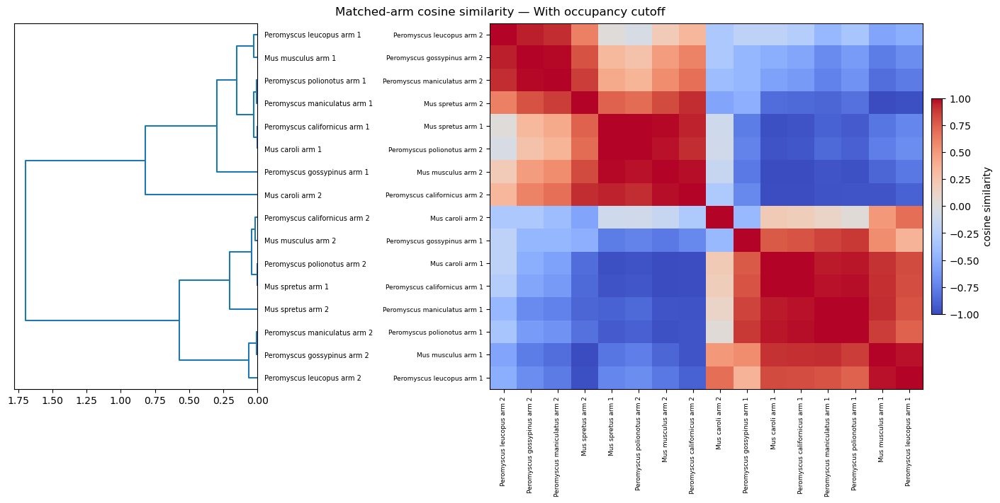

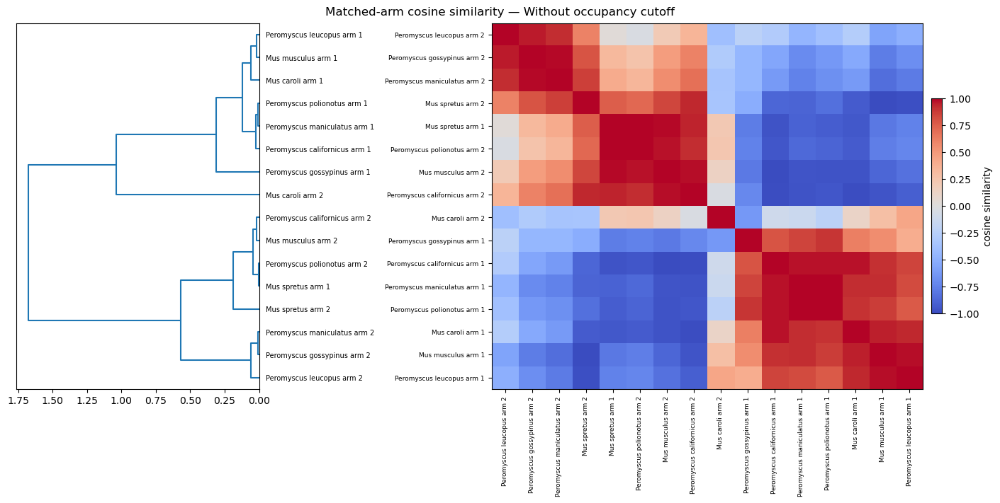

In [9]:
def plot_cosine_similarity(view: str):
    arrs = views[view]
    rows, vecs = [], []
    for sp in species_names:
        d   = arrs[sp]
        phi = d.get("phi_macro_shared")
        chi = d.get("chi_macro_aligned")
        pi  = d.get("pi_macro")
        if phi is None or chi is None or pi is None or phi.shape[1] < 3:
            continue
        ctrs = arm_centroid_in_space(phi[:, :3], chi, pi)
        for arm, ctr in enumerate(ctrs):
            rows.append({"label": f"{sp.replace('_',' ')} arm {arm+1}", "arm": arm})
            vecs.append(ctr)

    if len(vecs) < 2:
        print(f"Not enough arm vectors for cosine plot ({view})")
        return None

    vecs  = np.asarray(vecs, dtype=float)
    unit  = normalise_rows(vecs)
    cosim = unit @ unit.T
    dist  = np.clip(1 - cosim, 0, 2)
    link  = linkage(squareform(dist, checks=False), method="average")
    order = leaves_list(link)
    ordered_sim    = cosim[np.ix_(order, order)]
    ordered_labels = [rows[i]["label"] for i in order]

    fig, axes = plt.subplots(1, 2, figsize=(14, max(7, 0.28 * len(ordered_labels))),
                             constrained_layout=True, gridspec_kw={"width_ratios": [0.9, 1.6]})
    dendrogram(link, labels=[r["label"] for r in rows],
               orientation="left", ax=axes[0], leaf_font_size=7, color_threshold=0)
    im = axes[1].imshow(ordered_sim, cmap="coolwarm", vmin=-1, vmax=1,
                        aspect="auto", interpolation="nearest")
    axes[1].set_xticks(range(len(ordered_labels)))
    axes[1].set_xticklabels(ordered_labels, rotation=90, fontsize=6.5)
    axes[1].set_yticks(range(len(ordered_labels)))
    axes[1].set_yticklabels(ordered_labels, fontsize=6.5)
    fig.colorbar(im, ax=axes[1], label="cosine similarity", fraction=0.025, pad=0.02)
    fig.suptitle(f"Matched-arm cosine similarity — {VIEW_LABELS[view]}")
    plt.show()
    return fig

for view in VIEWS:
    plot_cosine_similarity(view)


## 9. Per-Arm Cloud Plots

One 3-D and 2-D panel per aligned arm showing all species' macro-cluster clouds
in the shared eigenspace, coloured by species.


=== With occupancy cutoff ===


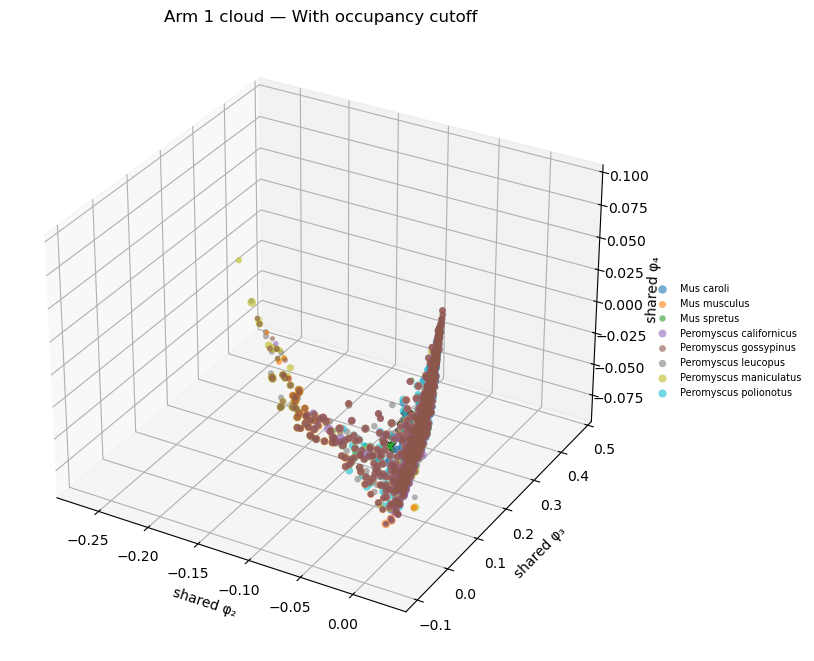

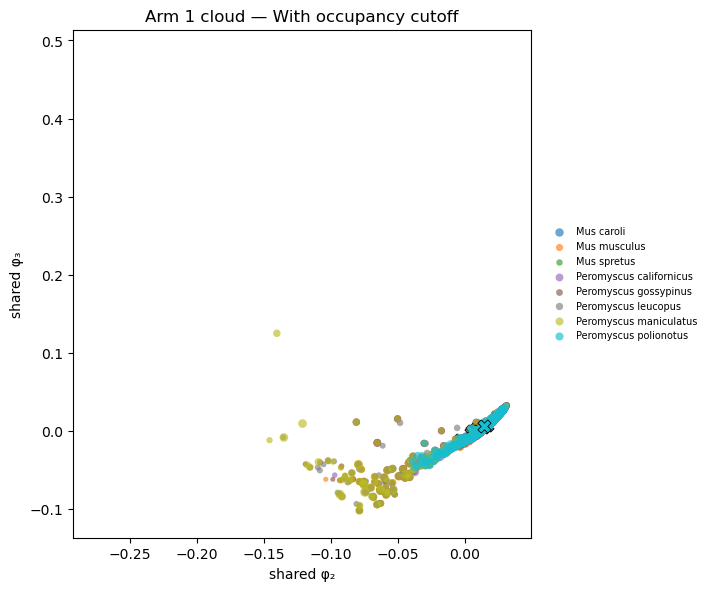

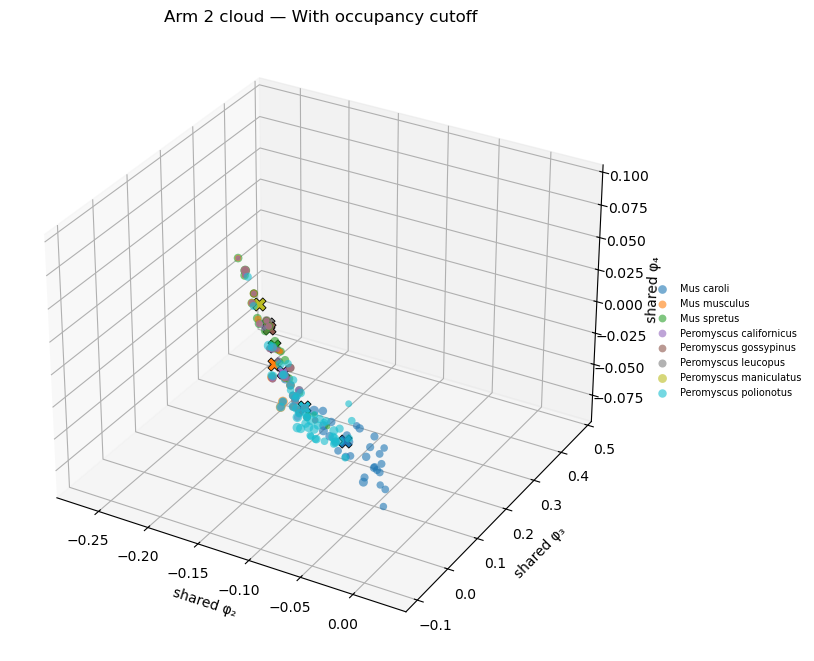

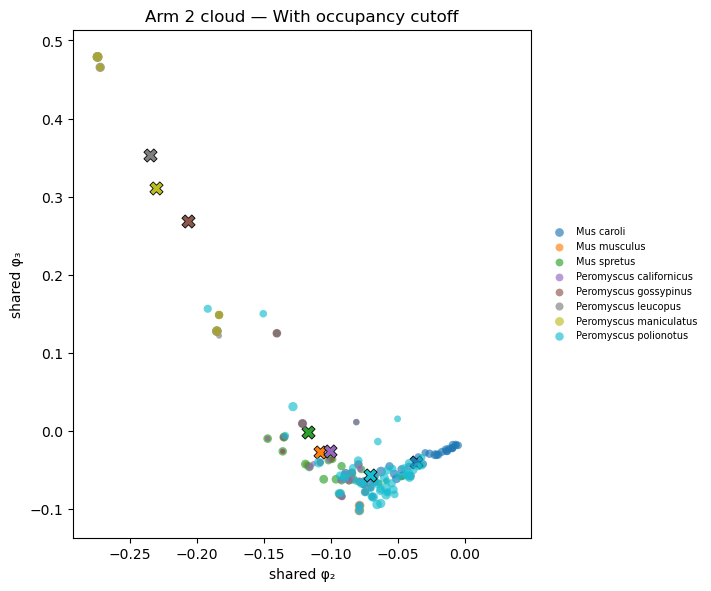


=== Without occupancy cutoff ===


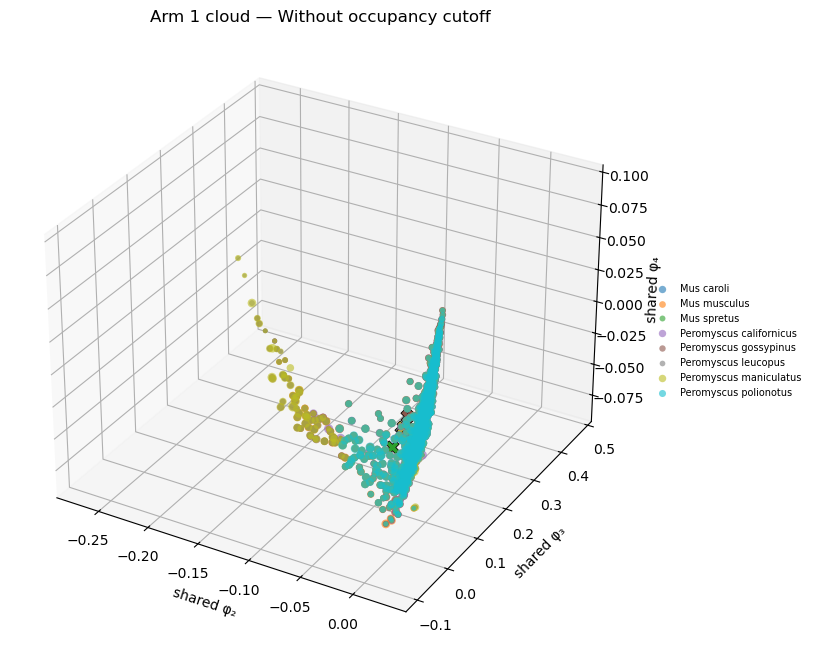

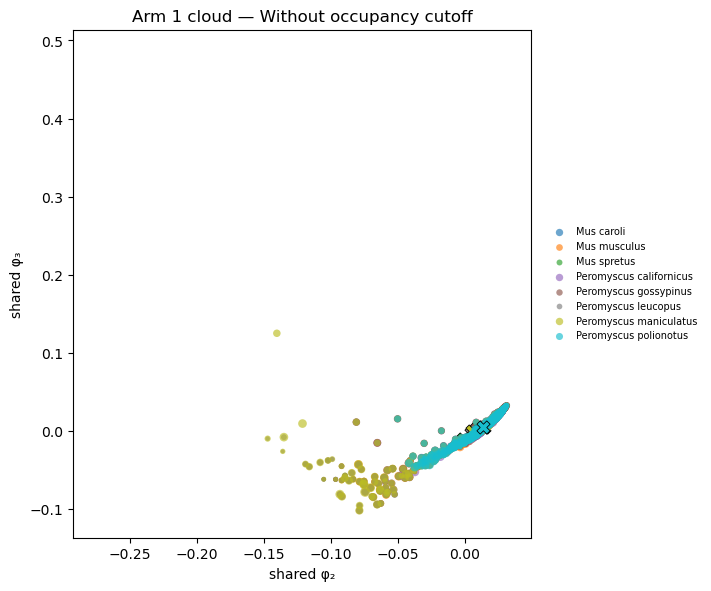

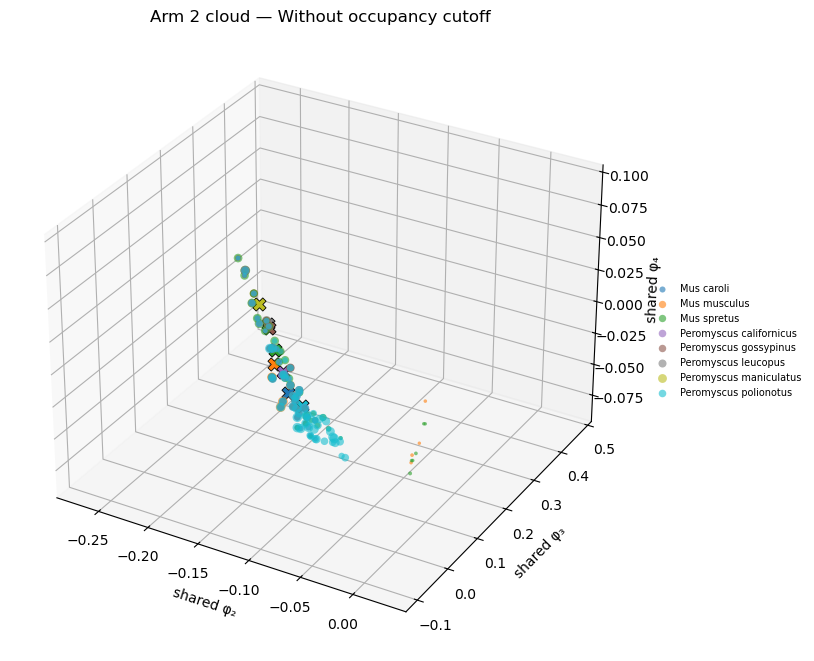

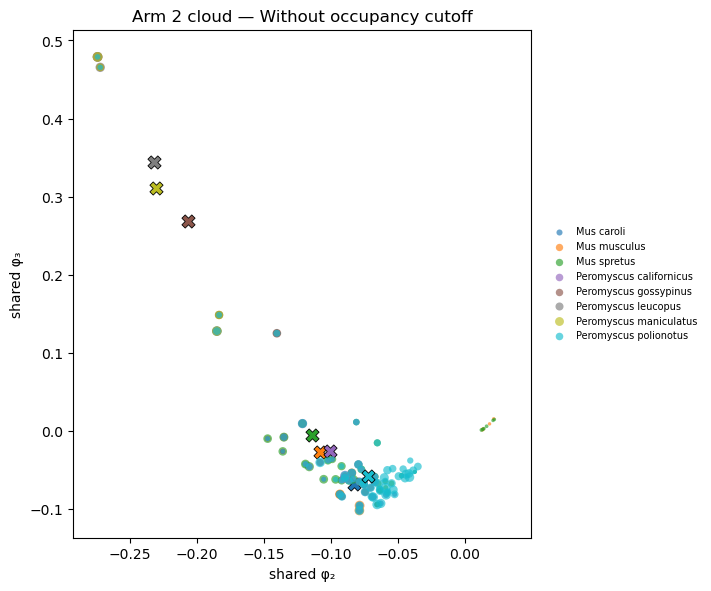

In [10]:
def plot_arm_clouds(view: str):
    arrs = views[view]
    # Gather all points for shared axis limits
    all_pts = []
    for sp in species_names:
        phi = arrs[sp].get("phi_macro_shared")
        occ = arrs[sp].get("macro_occupancy")
        if phi is not None and phi.shape[1] >= 3:
            mask = (occ > 0) & np.isfinite(phi[:, :3]).all(1) if occ is not None else np.isfinite(phi[:, :3]).all(1)
            all_pts.append(phi[mask, :3])
    all_pts = np.vstack(all_pts) if all_pts else np.zeros((1, 3))
    lo, hi = all_pts.min(0), all_pts.max(0)
    pad = 0.06 * np.maximum(hi - lo, 1e-12)
    lims = [(lo[d] - pad[d], hi[d] + pad[d]) for d in range(3)]

    for aligned_arm in range(N_BASINS):
        fig3 = plt.figure(figsize=(8, 6.5), constrained_layout=True)
        ax3  = fig3.add_subplot(111, projection="3d")
        fig2, ax2 = plt.subplots(figsize=(7, 5.8), constrained_layout=True)

        for sp in species_names:
            d    = arrs[sp]
            phi  = d.get("phi_macro_shared")
            arms = d.get("arm_assignments_macro_aligned")
            occ  = d.get("macro_occupancy")
            if phi is None or phi.shape[1] < 3 or arms is None:
                continue
            occ  = occ / max(occ.sum(), 1e-12) if occ is not None else np.ones(len(phi)) / len(phi)
            mask = (arms == aligned_arm) & (occ > 0) & np.isfinite(phi[:, :3]).all(1)
            if not mask.any():
                continue
            sizes = 6 + 44 * np.sqrt(occ[mask] / max(occ.max(), 1e-12))
            col   = species_colors[sp]
            ctr   = np.average(phi[mask, :3], axis=0, weights=occ[mask])
            ax3.scatter(*phi[mask, :3].T, s=sizes, color=col, alpha=0.6, linewidths=0, label=sp.replace("_", " "))
            ax3.scatter(*ctr, s=90, marker="X", color=col, edgecolors="k", linewidths=0.6)
            ax2.scatter(phi[mask, 0], phi[mask, 1], s=sizes, color=col, alpha=0.65, linewidths=0, label=sp.replace("_", " "))
            ax2.scatter(ctr[0], ctr[1], s=90, marker="X", color=col, edgecolors="k", linewidths=0.6)

        ax3.set_xlim(*lims[0]); ax3.set_ylim(*lims[1]); ax3.set_zlim(*lims[2])
        ax2.set_xlim(*lims[0]); ax2.set_ylim(*lims[1])
        ax3.set_xlabel("shared φ₂"); ax3.set_ylabel("shared φ₃"); ax3.set_zlabel("shared φ₄")
        ax2.set_xlabel("shared φ₂"); ax2.set_ylabel("shared φ₃")
        title = f"Arm {aligned_arm+1} cloud — {VIEW_LABELS[view]}"
        ax3.set_title(title); ax2.set_title(title)
        ax3.legend(frameon=False, fontsize=7, loc="center left", bbox_to_anchor=(1.02, 0.5))
        ax2.legend(frameon=False, fontsize=7, loc="center left", bbox_to_anchor=(1.02, 0.5))
        plt.show()

for view in VIEWS:
    print(f"\n=== {VIEW_LABELS[view]} ===")
    plot_arm_clouds(view)


## 10. UMAP Density and Log₂ Enrichment

Global cluster-centre UMAP coloured by:
- **Density**: species-specific occupancy-weighted cluster density
- **Enrichment**: log₂(species density / pooled density)
- **Arm enrichment**: log₂(arm-weighted density / pooled density)

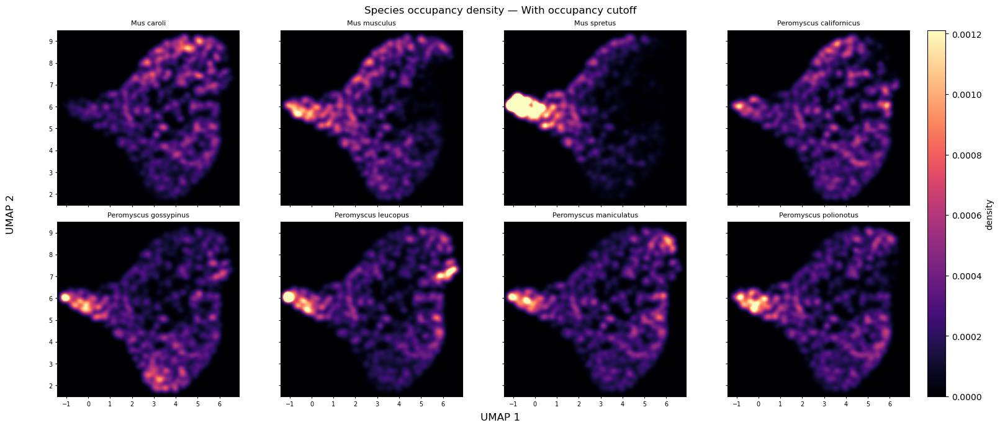

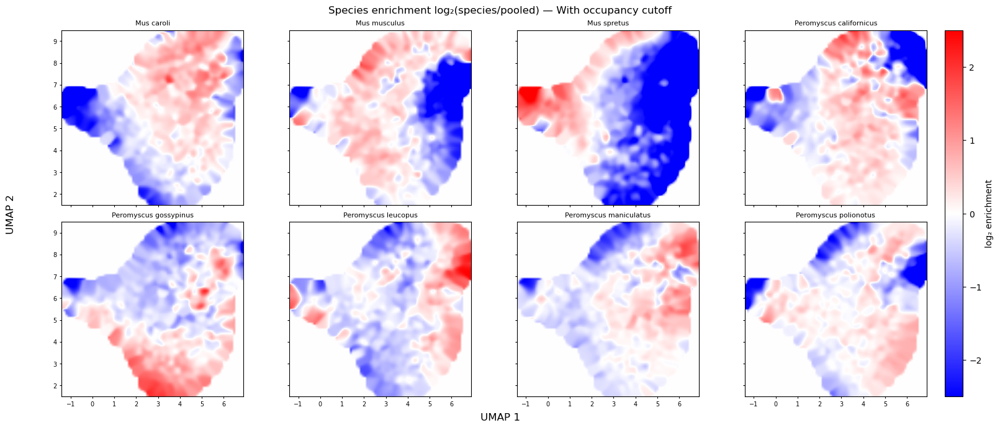

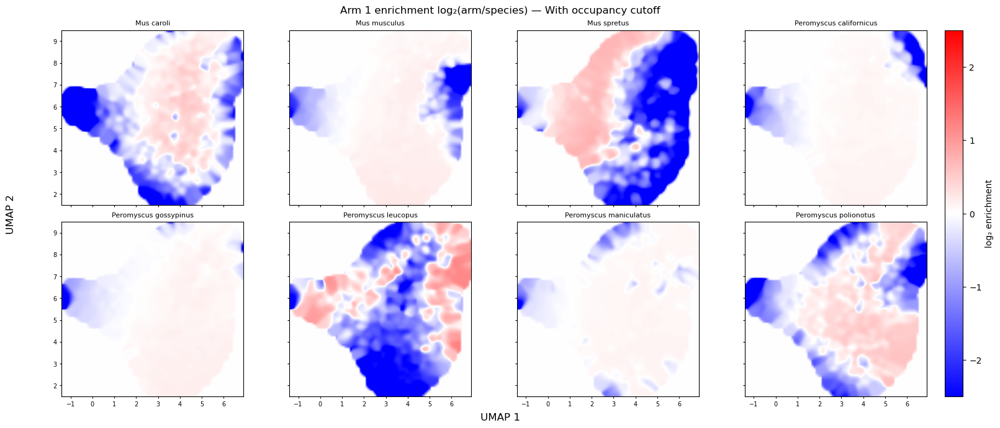

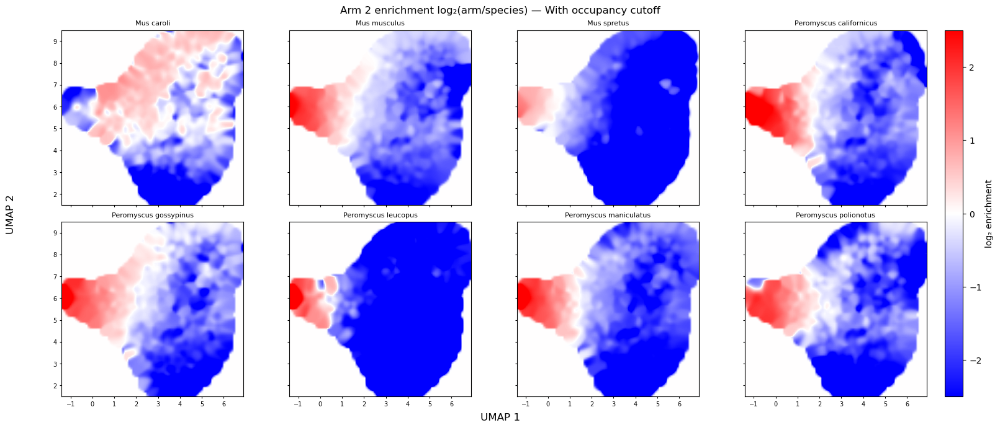

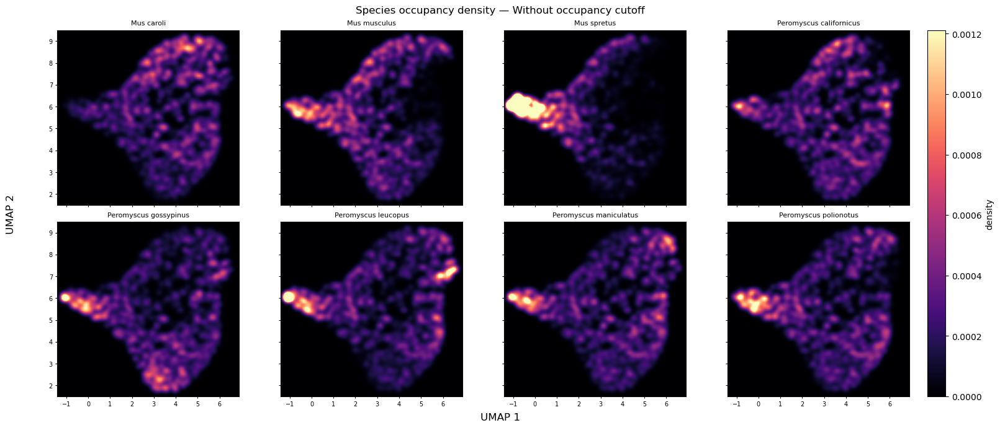

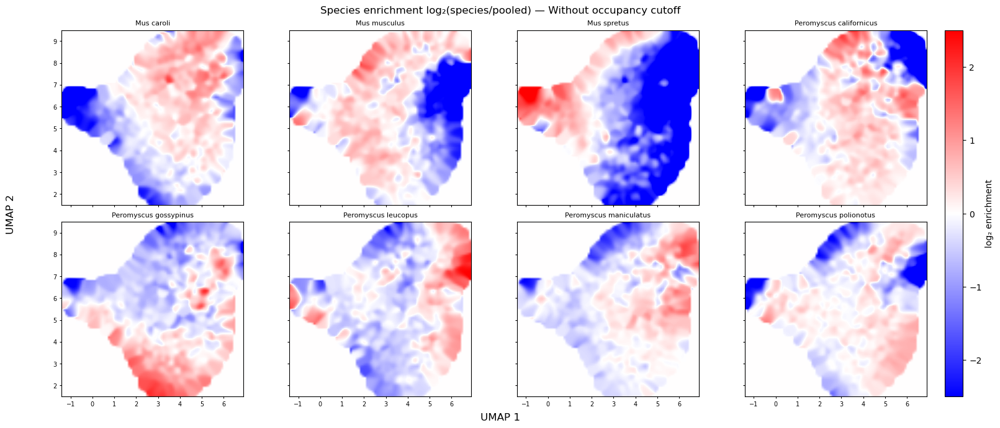

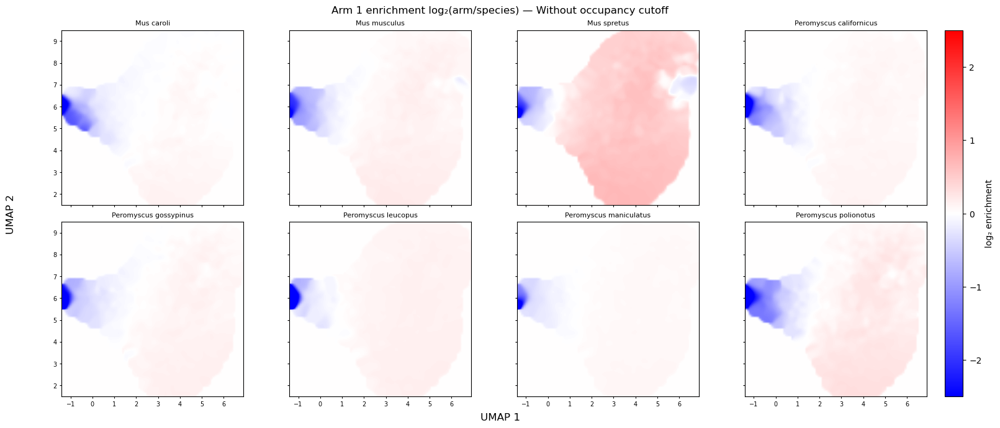

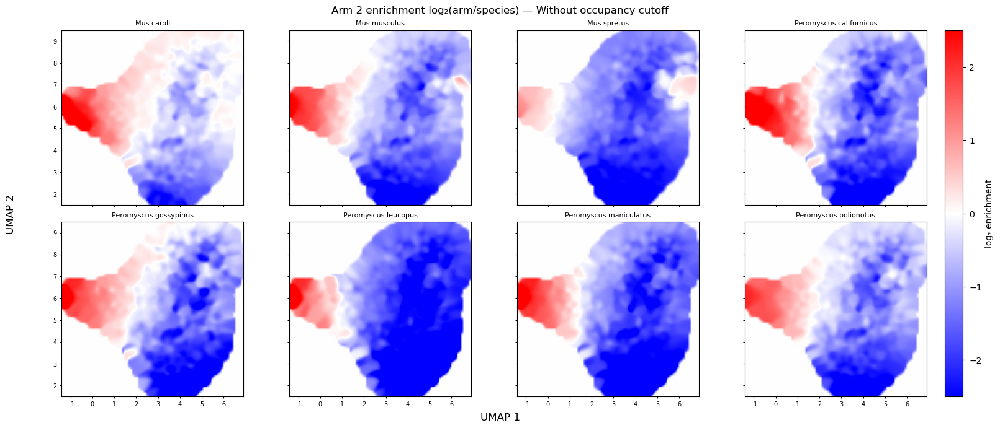

UMAP panels done.


In [11]:
if cluster_layout_2d is None:
    print("Skipping UMAP panels: global_cluster_embedding.csv not found.")
else:
    x = cluster_layout_2d[:, 0].astype(float)
    y = cluster_layout_2d[:, 1].astype(float)
    x_rng = x.max() - x.min(); y_rng = y.max() - y.min()
    x_edges = np.linspace(x.min() - 0.04*x_rng, x.max() + 0.04*x_rng, DENSITY_BINS + 1)
    y_edges = np.linspace(y.min() - 0.04*y_rng, y.max() + 0.04*y_rng, DENSITY_BINS + 1)
    x_ctrs  = 0.5 * (x_edges[:-1] + x_edges[1:])
    y_ctrs  = 0.5 * (y_edges[:-1] + y_edges[1:])
    extent  = [x_edges[0], x_edges[-1], y_edges[0], y_edges[-1]]

    def density_grid(weights, normalise=False):
        H, _, _ = np.histogram2d(x, y, bins=[x_edges, y_edges],
                                  weights=np.asarray(weights, dtype=float))
        H = gaussian_filter(H.T, sigma=DENSITY_SIGMA, mode="constant")
        if normalise:
            H /= max(H.sum(), EPS)
        return H

    def log2_enrich(obs_w, ref_w):
        obs = density_grid(obs_w, True)
        ref = density_grid(ref_w, True)
        return np.log2((obs + EPS) / (ref + EPS))

    def umap_panels(panel_grids, title, cmap, cb_label, vmin=None, vmax=None):
        n_sp   = len(species_names)
        n_cols = min(4, n_sp)
        n_rows = int(np.ceil(n_sp / n_cols))
        fig, axes = plt.subplots(n_rows, n_cols,
                                  figsize=(4.0 * n_cols, 3.4 * n_rows),
                                  sharex=True, sharey=True,
                                  constrained_layout=True, squeeze=False)
        im = None
        for ax, sp in zip(axes.flat, species_names):
            g = panel_grids.get(sp)
            if g is None:
                ax.set_visible(False); continue
            im = ax.imshow(g, origin="lower", extent=extent, cmap=cmap,
                           vmin=vmin, vmax=vmax, interpolation="bilinear", aspect="equal")
            ax.set_title(sp.replace("_", " "), fontsize=8)
            ax.tick_params(labelsize=7, length=2)
        for ax in axes.flat[len(species_names):]:
            ax.remove()
        if im is not None:
            fig.colorbar(im, ax=axes.flat[:len(species_names)], location="right",
                         fraction=0.025, pad=0.02, label=cb_label)
        fig.supxlabel("UMAP 1"); fig.supylabel("UMAP 2")
        fig.suptitle(title)
        plt.show()
        return fig

    for view in VIEWS:
        arrs = views[view]
        # ── Occupancy density ──────────────────────────────────────────────
        occ_grids = {}
        pooled_w  = np.zeros(len(x))
        for sp in species_names:
            w = arrs[sp].get("occupancy_global", np.zeros(len(x)))
            w = np.asarray(w, dtype=float)
            w /= max(w.sum(), EPS)
            occ_grids[sp] = density_grid(w)
            pooled_w += w
        pooled_w /= max(pooled_w.sum(), EPS)

        all_grids_flat = np.concatenate([g.ravel() for g in occ_grids.values()])
        vmax_occ = np.percentile(all_grids_flat[all_grids_flat > 0], DENSITY_VMAX_P) if all_grids_flat.any() else 1.0

        umap_panels(occ_grids,
                    f"Species occupancy density — {VIEW_LABELS[view]}",
                    "magma", "density", vmin=0, vmax=vmax_occ)

        # ── Log₂ species enrichment ────────────────────────────────────────
        enrich_grids = {sp: log2_enrich(arrs[sp].get("occupancy_global", np.zeros(len(x))), pooled_w)
                        for sp in species_names}
        umap_panels(enrich_grids,
                    f"Species enrichment log₂(species/pooled) — {VIEW_LABELS[view]}",
                    "bwr", "log₂ enrichment",
                    vmin=-ENRICH_VMAX, vmax=ENRICH_VMAX)

        # ── Per-arm enrichment ─────────────────────────────────────────────
        for arm in range(N_BASINS):
            arm_enrich = {}
            for sp in species_names:
                chi = arrs[sp].get("chi_global_aligned")
                occ = arrs[sp].get("occupancy_global", np.zeros(len(x)))
                occ = np.asarray(occ, dtype=float)
                if chi is None or chi.shape[1] <= arm:
                    arm_enrich[sp] = np.zeros((DENSITY_BINS, DENSITY_BINS))
                    continue
                arm_w = chi[:, arm] * occ
                arm_enrich[sp] = log2_enrich(arm_w, occ)
            umap_panels(arm_enrich,
                        f"Arm {arm+1} enrichment log₂(arm/species) — {VIEW_LABELS[view]}",
                        "bwr", "log₂ enrichment",
                        vmin=-ENRICH_VMAX, vmax=ENRICH_VMAX)

print("UMAP panels done." if cluster_layout_2d is not None else "")


## 11. MoSeq Syllable Heatmaps per Matched Arm

Loads `matched_arm_syllable_probs.csv` (exported by notebook 00 section 6f)
and plots the top-syllable occupancy per arm per species.


=== MoSeq syllable heatmaps — noise filtered (labeled syllables only) ===


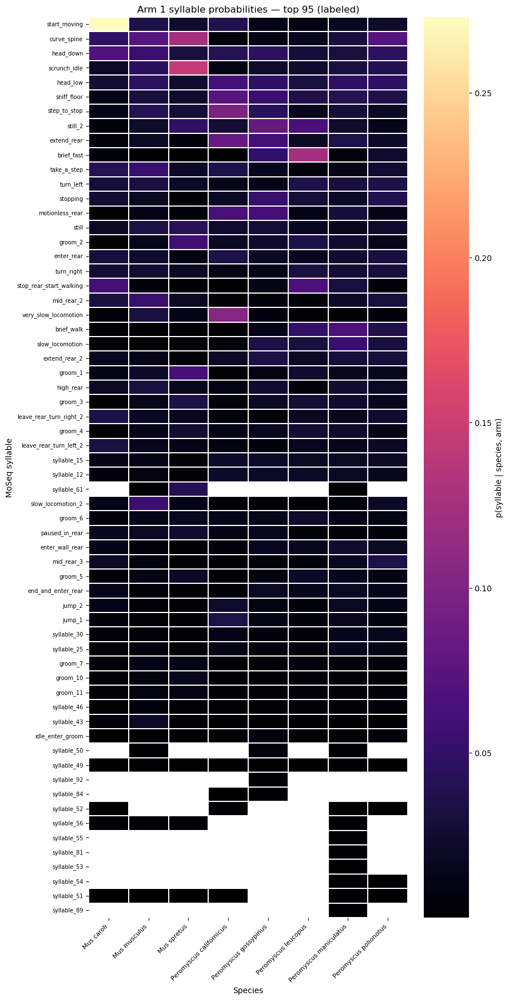

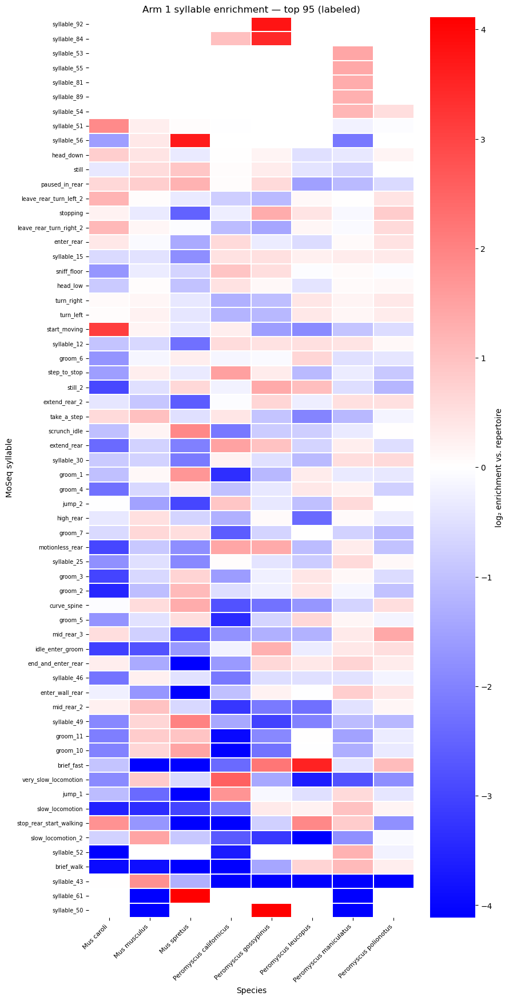

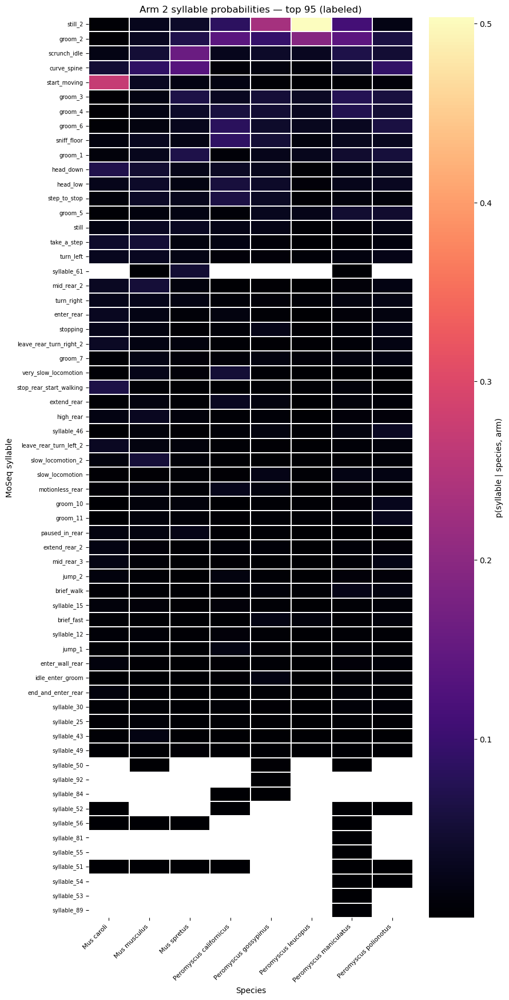

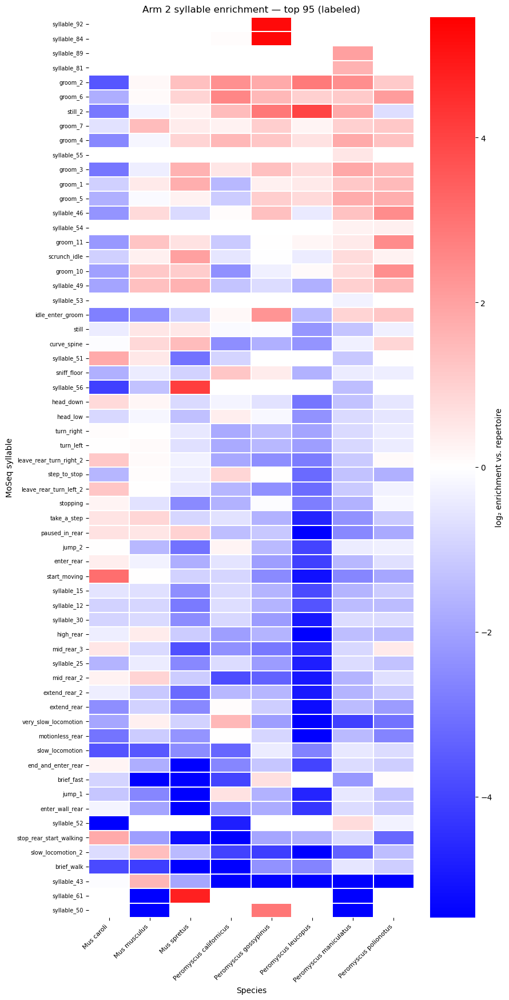


=== MoSeq syllable heatmaps — unfiltered (all syllables) ===


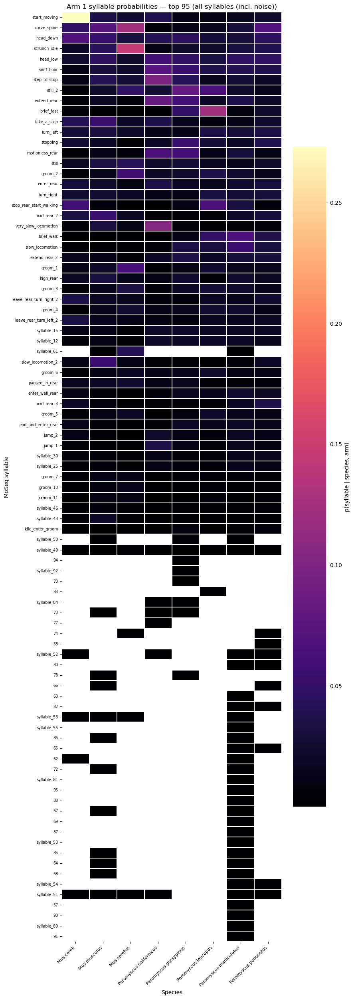

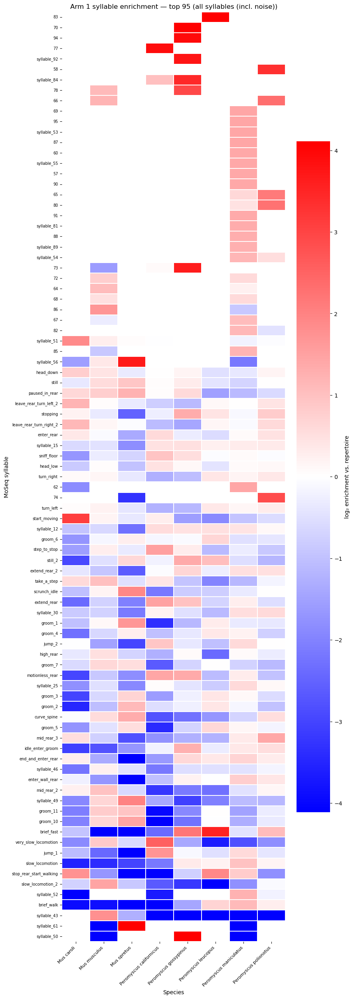

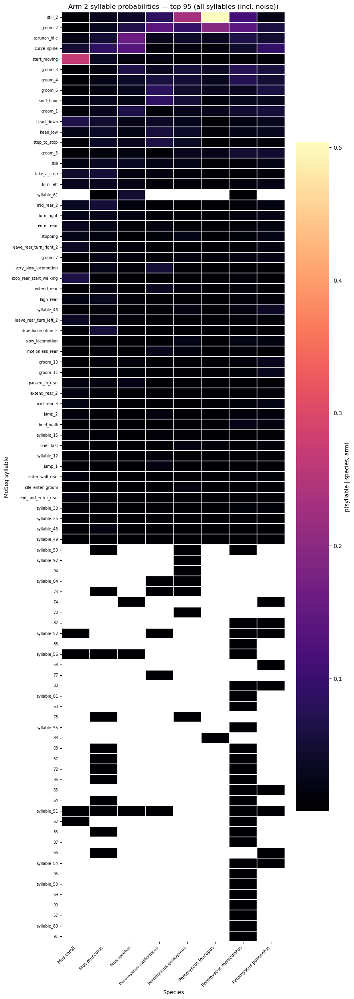

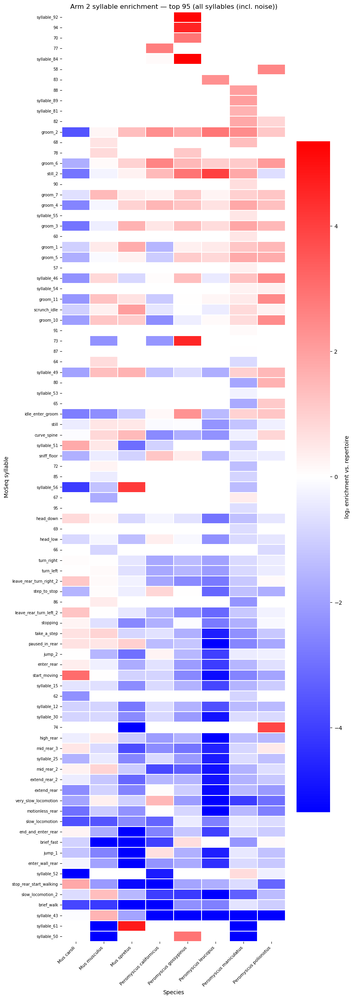

In [18]:
if moseq_probs is None:
    print("matched_arm_syllable_probs.csv not found — skipping syllable heatmaps.")
else:
    import seaborn as sns

    MOSEQ_TOP_N = 95
    ENRICH_EPS = 1e-9

    def plot_moseq_heatmap(filter_noise: bool = True):
        """
        Per-arm probability + enrichment heatmaps.

        Rows    = MoSeq syllables
        Columns = species

        filter_noise=True:
            restrict to syllables with a descriptive moseq_label
            (drop numeric/unlabeled noise).

        filter_noise=False:
            include all syllables.
        """

        df = moseq_probs.copy()

        required = {
            "species",
            "aligned_arm",
            "moseq_cluster",
            "p_syllable_given_species_arm"
        }

        if not required.issubset(df.columns):
            print(f"Unexpected columns in moseq CSV: {list(df.columns)}")
            return

        # ------------------------------------------------------------
        # Build cluster-ID -> label map
        # ------------------------------------------------------------
        has_labels = "moseq_label" in df.columns

        if has_labels:
            label_map = (
                df.dropna(subset=["moseq_label"])
                .drop_duplicates("moseq_cluster")
                .set_index("moseq_cluster")["moseq_label"]
                .to_dict()
            )
        else:
            label_map = {}

        # ------------------------------------------------------------
        # Remove numeric-only labels if filtering noise
        # ------------------------------------------------------------
        if filter_noise and has_labels:
            df = df[
                ~df["moseq_label"]
                .astype(str)
                .str.match(r"^\d+$")
            ]

        noise_tag = (
            "labeled"
            if filter_noise
            else "all syllables (incl. noise)"
        )

        def syl_label(cid):
            return label_map.get(cid, str(cid))

        # CSV arms are 1-indexed
        valid_arms = [
            a for a in sorted(df["aligned_arm"].unique())
            if a <= N_BASINS
        ]

        for arm in valid_arms:

            sub = df[df["aligned_arm"] == arm]

            # ========================================================
            # PROBABILITY HEATMAP
            # ========================================================

            top_syl = (
                sub.groupby("moseq_cluster")[
                    "p_syllable_given_species_arm"
                ]
                .mean()
                .nlargest(MOSEQ_TOP_N)
                .index
                .tolist()
            )

            sub_p = sub[
                sub["moseq_cluster"].isin(top_syl)
            ]

            pivot_p = sub_p.pivot_table(
                index="moseq_cluster",
                columns="species",
                values="p_syllable_given_species_arm",
                aggfunc="mean"
            ).reindex(top_syl)

            pivot_p.index = [
                syl_label(c)
                for c in pivot_p.index
            ]

            pivot_p.columns = [
                c.replace("_", " ")
                for c in pivot_p.columns
            ]

            n_syl = len(pivot_p.index)
            n_sp = len(pivot_p.columns)

            # Tall figure:
            # species horizontally, syllables vertically
            fig, ax = plt.subplots(
                figsize=(
                    max(8, n_sp * 1.1),
                    max(8, n_syl * 0.28)
                ),
                constrained_layout=True
            )

            sns.heatmap(
                pivot_p,
                ax=ax,
                cmap="magma",
                linewidths=0.3,
                linecolor="white",
                cbar_kws={
                    "label": "p(syllable | species, arm)"
                }
            )

            ax.set_title(
                f"Arm {arm} syllable probabilities — "
                f"top {MOSEQ_TOP_N} ({noise_tag})"
            )

            ax.set_xlabel("Species")
            ax.set_ylabel("MoSeq syllable")

            ax.tick_params(
                axis="x",
                labelrotation=45,
                labelsize=8
            )

            ax.tick_params(
                axis="y",
                labelrotation=0,
                labelsize=7
            )

            # Right-align rotated species labels
            plt.setp(
                ax.get_xticklabels(),
                ha="right"
            )

            plt.show()

            # ========================================================
            # ENRICHMENT HEATMAP
            # ========================================================

            if "log2_enrichment_vs_repertoire" not in df.columns:
                continue

            top_enr = (
                sub.groupby("moseq_cluster")[
                    "log2_enrichment_vs_repertoire"
                ]
                .mean()
                .nlargest(MOSEQ_TOP_N)
                .index
                .tolist()
            )

            sub_e = sub[
                sub["moseq_cluster"].isin(top_enr)
            ]

            pivot_e = sub_e.pivot_table(
                index="moseq_cluster",
                columns="species",
                values="log2_enrichment_vs_repertoire",
                aggfunc="mean"
            ).reindex(top_enr)

            pivot_e.index = [
                syl_label(c)
                for c in pivot_e.index
            ]

            pivot_e.columns = [
                c.replace("_", " ")
                for c in pivot_e.columns
            ]

            n_syl_e = len(pivot_e.index)
            n_sp_e = len(pivot_e.columns)

            fig, ax = plt.subplots(
                figsize=(
                    max(8, n_sp_e * 1.1),
                    max(8, n_syl_e * 0.28)
                ),
                constrained_layout=True
            )

            finite_vals = pivot_e.values[
                np.isfinite(pivot_e.values)
            ]

            vmax = (
                np.nanpercentile(
                    np.abs(finite_vals),
                    95
                )
                if len(finite_vals)
                else 2
            )

            sns.heatmap(
                pivot_e,
                ax=ax,
                cmap="bwr",
                center=0,
                vmin=-vmax,
                vmax=vmax,
                linewidths=0.3,
                linecolor="white",
                cbar_kws={
                    "label": "log₂ enrichment vs. repertoire"
                }
            )

            ax.set_title(
                f"Arm {arm} syllable enrichment — "
                f"top {MOSEQ_TOP_N} ({noise_tag})"
            )

            ax.set_xlabel("Species")
            ax.set_ylabel("MoSeq syllable")

            ax.tick_params(
                axis="x",
                labelrotation=45,
                labelsize=8
            )

            ax.tick_params(
                axis="y",
                labelrotation=0,
                labelsize=7
            )

            plt.setp(
                ax.get_xticklabels(),
                ha="right"
            )

            plt.show()


    print(
        "\n=== MoSeq syllable heatmaps — "
        "noise filtered (labeled syllables only) ==="
    )
    plot_moseq_heatmap(filter_noise=True)

    print(
        "\n=== MoSeq syllable heatmaps — "
        "unfiltered (all syllables) ==="
    )
    plot_moseq_heatmap(filter_noise=False)

## 12. With vs. Without Cutoff — Side-by-Side Eigenvalue Comparison

For each species, compare how the leading eigenvalue magnitudes change
when the low-occupancy clusters are excluded.

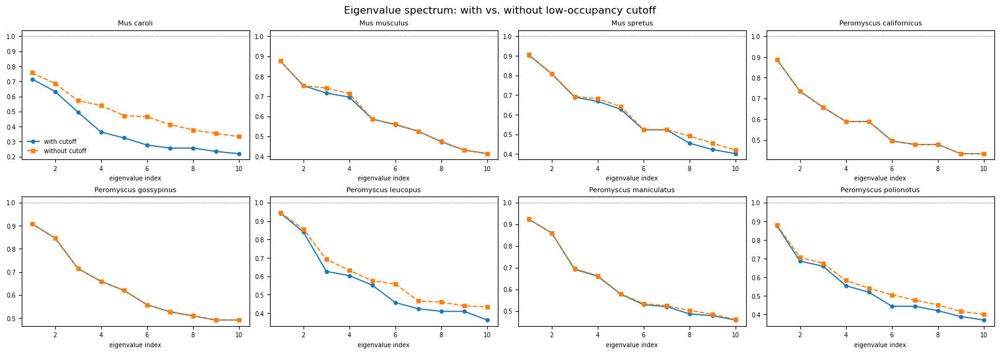

In [13]:
n_sp   = len(species_names)
n_cols = min(4, n_sp)
n_rows = int(np.ceil(n_sp / n_cols))
fig, axes = plt.subplots(n_rows, n_cols,
                          figsize=(4 * n_cols, 2.8 * n_rows),
                          constrained_layout=True, squeeze=False)

for ax, sp in zip(axes.flat, species_names):
    for view, ls, lbl in zip(VIEWS, ["-o", "--s"],
                              ["with cutoff", "without cutoff"]):
        ev = np.abs(views[view][sp]["evals"])
        ax.plot(np.arange(1, len(ev) + 1), ev, ls, lw=1.4, ms=4, label=lbl)
    ax.axhline(1.0, color="k", lw=0.5, ls=":")
    ax.set_title(sp.replace("_", " "), fontsize=8)
    ax.set_xlabel("eigenvalue index", fontsize=7)
    ax.tick_params(labelsize=7)
    if ax is axes.flat[0]:
        ax.legend(fontsize=7, frameon=False)

for ax in axes.flat[len(species_names):]:
    ax.remove()

fig.suptitle("Eigenvalue spectrum: with vs. without low-occupancy cutoff")
plt.show()


## 13. PCA of MoSeq Syllable Enrichment Across Arms and Species

Each species-arm is a point in syllable space. The feature vector is the
**within-species** log-enrichment

$$L_{sp,\,arm}(s) \;=\; \log_2 \frac{p(s \mid sp,\, arm)}{p(s \mid sp)}$$

over the full union of MoSeq syllables. Referencing each species to *its own*
repertoire removes species-level baseline differences in syllable usage, so the
axes describe **arm structure**, not which syllables a species happens to use.

Syllables a species never emits are handled by additive smoothing of the
soft-frame counts (prior mass `SYLLABLE_PSEUDO_FRAC` x a uniform share per
species-arm). With the smoothing applied identically to numerator and
denominator, an unused syllable contributes **exactly 0** — it neither inflates
nor deflates the distance between arms.

Two views, both requested:

1. **Species x arm** (16 points) — does arm separate on a shared axis, and where
   does each species sit along it?
2. **Arm contrast** (8 points) — one vector per species,
   $\Delta_{sp}(s) = \log_2 p(s \mid sp,\,arm\,2) / p(s \mid sp,\,arm\,1)$,
   which is the quantity "how enrichment differs between arms" directly.

Because the reference is the species' own repertoire, the two arms of a species
sit almost symmetrically about the origin in view 1, so the two views carry the
same information — view 1 shows it as a per-species *arrow*, view 2 as a point.

> **Interpretation caveat.** PC1 of the raw arm-contrast PCA mixes *how much* the
> arms differ (the norm of $\Delta$) with *which way* they differ (its
> direction). The unit-normalised panel and the $\|\Delta\|$ bar chart separate
> the two; the cosine matrix in 13.3 answers the direction question on its own.

In [ ]:
# --- syllable table -------------------------------------------------------
# matched_arm_syllable_probs.csv uses only the FIRST recording per subject, which
# costs Mus ~2/3 of its data while leaving Peromyscus (mostly single-recording)
# intact -- an asymmetry along the exact contrast this section studies. The
# full-join table is rebuilt from all recordings by scripts/join.py, validated to
# reproduce the reference exactly when restricted to the reference's scope.
# The low-occupancy cut is uniform per cluster but very uneven per species: it
# covers 99.8% of P. gossypinus frames and only 45.2% of P. leucopus frames,
# because leucopus spreads its time thinly over many individually-rare clusters.
# ARM_VIEW = "without_low_occupancy_cutoff" uses the 100%-coverage arms.
ARM_VIEW = "without_low_occupancy_cutoff"   # 100% frame coverage for every species;
#            set to "with_low_occupancy_cutoff" to reproduce the cut-arms results
USE_FULL_JOIN = True
_full = RUN_ROOT / ("matched_arm_syllable_probs_full_join.csv"
                    if ARM_VIEW == "with_low_occupancy_cutoff"
                    else "matched_arm_syllable_probs_full_join_nocut.csv")
if USE_FULL_JOIN and _full.exists():
    moseq_probs = pd.read_csv(_full)
    print(f"Syllable table: FULL JOIN, arms from {ARM_VIEW!r} "
          f"({moseq_probs.soft_frames.sum():,.0f} soft frames)")
else:
    print(f"Syllable table: reference, first recording per subject "
          f"({moseq_probs.soft_frames.sum():,.0f} soft frames)")

SYLLABLE_PSEUDO_FRAC = 0.01     # prior mass per syllable, as a fraction of a uniform share
ENRICH_REFERENCE     = "species"  # "species" -> log2( p(s|sp,arm) / p(s|sp) );  "pooled" -> vs cross-species repertoire
SYLLABLE_SUBSET      = "labeled"  # "labeled" (the 50 named syllables) | "all" (89)
DROP_CLUSTERS        = {26}       # clusters excluded regardless of subset; {} to keep all

# Cluster 26 (still_2) is flagged "possible noise" in the label table and is the
# largest positive PC1 loading. It is also 50% of P. leucopus arm 2 and 23% of
# P. gossypinus arm 2, so if it is a tracking artifact rather than a behaviour it
# would distort those two species specifically. It is dropped by default; set
# DROP_CLUSTERS = set() to put it back.

# Syllable names and behavioural categories come from the curated KPMS label table
# (`moseq_syllable_labels.csv` at the repo root, transcribed from
# kpms_syll_names-022525), NOT from the `moseq_label` column of
# matched_arm_syllable_probs.csv. That column is stale: it carries placeholder
# "syllable_<n>" strings for clusters 12, 15, 25, 30, 43, 46 and 49, which are
# really leave_rear_turn_right, leave_rear_turn_left, mid_rear, mid_rear_4,
# very_fast, groom_9 and groom_12. Five of the seven are rear or locomotion
# syllables, i.e. exactly the ones that load hardest on the arm axis.
#
# The named syllables are clusters 0-49, and those are EXACTLY the 50 present in
# every species-arm (verified), carrying 99.8% of the pooled repertoire mass.
# Clusters >= 50 are the unnamed noise tail: each is absent from at least one
# species, and together they are 0.2% of the mass.
LABELS_CSV = next((p / "moseq_syllable_labels.csv"
                   for p in [Path.cwd(), Path.cwd().parent, *RUN_ROOT.parents]
                   if (p / "moseq_syllable_labels.csv").exists()), None)
if LABELS_CSV is None:
    raise FileNotFoundError("moseq_syllable_labels.csv not found (expected at the repo root)")

MOSEQ_LABELS   = pd.read_csv(LABELS_CSV).set_index("moseq_cluster")
SYLLABLE_NAME  = MOSEQ_LABELS["name"].to_dict()
SYLLABLE_CAT   = MOSEQ_LABELS["category"].to_dict()
SYLLABLE_NOTE  = MOSEQ_LABELS["note"].dropna().to_dict()
NAMED_CLUSTERS = set(MOSEQ_LABELS.index)

# Fixed category order and colours, assigned by name so a filtered plot never
# repaints the survivors.
GENUS_MARKERS   = {"Mus": "o", "Peromyscus": "s"}
CATEGORY_ORDER  = ["rear", "groom", "idle", "locomotion", "turn", "jump", "unnamed"]
CATEGORY_COLORS = dict(zip(CATEGORY_ORDER, plt.get_cmap("Dark2").colors))

print(f"Label table: {LABELS_CSV}  ({len(MOSEQ_LABELS)} named syllables, "
      f"categories: {MOSEQ_LABELS.category.value_counts().to_dict()})")
if SYLLABLE_NOTE:
    for c, n in SYLLABLE_NOTE.items():
        print(f"  note - cluster {c} ({SYLLABLE_NAME[c]}): {n}")


def select_syllables(df, subset, drop=None):
    """Apply SYLLABLE_SUBSET and DROP_CLUSTERS. Returns the filtered frame."""
    if subset in ("labeled", "named", "common"):
        df = df[df["moseq_cluster"].isin(NAMED_CLUSTERS)]
    elif subset != "all":
        raise ValueError(f"unknown SYLLABLE_SUBSET: {subset!r}")
    drop = DROP_CLUSTERS if drop is None else drop
    if drop:
        df = df[~df["moseq_cluster"].isin(set(drop))]
    return df


def build_syllable_enrichment_matrix(df, reference=ENRICH_REFERENCE,
                                     pseudo_frac=SYLLABLE_PSEUDO_FRAC,
                                     subset=SYLLABLE_SUBSET, drop=None):
    """
    Syllable-enrichment matrix over the full syllable union, with absent
    syllables handled by additive smoothing of the soft-frame counts.

    Each species-arm gets prior mass `pseudo_frac` x (uniform share), so a
    syllable a species never uses contributes exactly 0 to its log-ratio
    rather than an arbitrarily large negative number.

    Returns
    -------
    L      : (n_species*n_arms, n_syllables) log2 enrichment
    rows   : MultiIndex of (species, aligned_arm)
    sylls  : moseq_cluster ids (columns of L)
    labels : moseq_label per column
    P_arm  : smoothed p(syllable | species, arm)
    P_sp   : smoothed p(syllable | species)
    """
    df       = select_syllables(df, subset, drop)
    sp_list  = sorted(df["species"].unique())
    arm_list = sorted(a for a in df["aligned_arm"].unique() if a <= N_BASINS)
    full_ix  = pd.MultiIndex.from_product([sp_list, arm_list],
                                          names=["species", "aligned_arm"])
    counts = (df.pivot_table(index=["species", "aligned_arm"], columns="moseq_cluster",
                             values="soft_frames", aggfunc="sum")
                .reindex(index=full_ix)
                .fillna(0.0))
    sylls = list(counts.columns)
    n_syl = len(sylls)
    C     = counts.values.astype(float)

    def smooth(mat):
        tot   = mat.sum(1, keepdims=True)
        alpha = pseudo_frac * tot / n_syl
        return (mat + alpha) / (tot + alpha * n_syl)

    P_arm = smooth(C)
    sp_ix = counts.index.get_level_values("species")
    P_sp  = smooth(np.vstack([C[sp_ix == sp].sum(0) for sp in sp_list]))

    if reference == "species":
        ref = np.vstack([P_sp[sp_list.index(sp)] for sp in sp_ix])
    elif reference == "pooled":
        ref = np.repeat(smooth(C.sum(0, keepdims=True)), len(C), axis=0)
    else:
        raise ValueError(f"unknown reference: {reference}")

    L = np.log2(P_arm / ref)

    labels = [SYLLABLE_NAME.get(c, f"unnamed_{c}") for c in sylls]
    return L, counts.index, sylls, labels, P_arm, P_sp


def pca_svd(X):
    """Column-centred PCA by SVD. Returns scores, components, explained-var ratio."""
    X  = np.asarray(X, dtype=float)
    Xc = X - X.mean(0)
    U, S, Vt = np.linalg.svd(Xc, full_matrices=False)
    var = S ** 2 / max(Xc.shape[0] - 1, 1)
    return U * S, Vt, var / max(var.sum(), EPS)


def declutter_labels(ax, texts, n_iter=80, step=1.6, pad=1.0):
    """Nudge annotation offsets vertically until their boxes stop overlapping."""
    if len(texts) < 2:
        return
    fig = ax.figure
    fig.canvas.draw()
    rend = fig.canvas.get_renderer()
    for _ in range(n_iter):
        boxes = [t.get_window_extent(renderer=rend).expanded(1.0, 1.0 + pad / 10)
                 for t in texts]
        moved = False
        for i in range(len(texts)):
            for j in range(i + 1, len(texts)):
                if not boxes[i].overlaps(boxes[j]):
                    continue
                moved = True
                di = 1.0 if boxes[i].y0 >= boxes[j].y0 else -1.0
                for t, d in ((texts[i], di), (texts[j], -di)):
                    dx, dy = t.xyann
                    t.xyann = (dx, dy + d * step)
        if not moved:
            break
        fig.canvas.draw()


def genus_of(sp):
    return sp.split("_")[0]


L_syl, syl_rows, syl_ids, syl_labels, P_arm, P_sp = build_syllable_enrichment_matrix(moseq_probs)
syl_species = list(syl_rows.get_level_values("species"))
syl_arms    = list(syl_rows.get_level_values("aligned_arm"))

# Per-species arm-contrast vectors: delta = log2( p(s|sp,arm2) / p(s|sp,arm1) )
row_of = {(sp, arm): i for i, (sp, arm) in enumerate(syl_rows)}
D_syl  = np.vstack([L_syl[row_of[(sp, 2)]] - L_syl[row_of[(sp, 1)]] for sp in species_names])
D_norm = np.linalg.norm(D_syl, axis=1)
D_unit = D_syl / np.maximum(D_norm[:, None], EPS)

scores_sa, comps_sa, evr_sa = pca_svd(L_syl)      # 16 species-arm rows
scores_d,  comps_d,  evr_d  = pca_svd(D_syl)      # 8 arm-contrast rows
scores_u,  comps_u,  evr_u  = pca_svd(D_unit)     # 8 direction-only rows

_mass = (moseq_probs.drop_duplicates("moseq_cluster")
                    .set_index("moseq_cluster")["p_syllable_repertoire"]
                    .reindex(syl_ids).sum())
syl_category = [SYLLABLE_CAT.get(c, "unnamed") for c in syl_ids]
print(f"Enrichment matrix: {L_syl.shape[0]} species-arm rows x {L_syl.shape[1]} syllables "
      f"(subset = {SYLLABLE_SUBSET!r}, dropped = {sorted(DROP_CLUSTERS) or 'none'}, "
      f"{_mass:.1%} of pooled repertoire mass, reference = {ENRICH_REFERENCE})")
print(f"  species-arm PCA   EVR: {np.round(evr_sa[:4], 3)}")
print(f"  arm-contrast PCA  EVR: {np.round(evr_d[:4], 3)}")
print(f"  direction-only PCA EVR: {np.round(evr_u[:4], 3)}")

### 13.1 Species x arm PCA

Filled marker = arm 1, open marker = arm 2, arrow runs from one to the other.
Marker shape encodes genus so identity never rests on colour alone.

In [ ]:
def plot_species_arm_pca(pc_x=0, pc_y=1):
    fig, axes = plt.subplots(1, 2, figsize=(13.5, 5.6), constrained_layout=True,
                             gridspec_kw={"width_ratios": [1, 1.5]})

    ax = axes[0]
    k = min(8, len(evr_sa))
    ax.plot(np.arange(1, k + 1), evr_sa[:k] * 100, "-o", lw=1.6, ms=5,
            color="0.25", label="species x arm")
    ax.plot(np.arange(1, min(8, len(evr_d)) + 1), evr_d[:min(8, len(evr_d))] * 100,
            "--s", lw=1.6, ms=5, color="0.6", label="arm contrast")
    ax.set_xlabel("principal component"); ax.set_ylabel("variance explained (%)")
    ax.set_title("Scree", fontsize=10)
    ax.legend(fontsize=8, frameon=False)
    ax.grid(alpha=0.25, lw=0.5); ax.set_axisbelow(True)
    for s in ("top", "right"): ax.spines[s].set_visible(False)

    ax = axes[1]
    ctr = scores_sa[:, [pc_x, pc_y]].mean(0)
    labels = []
    for sp in species_names:
        i1, i2 = row_of[(sp, 1)], row_of[(sp, 2)]
        c = species_colors[sp]
        p1 = scores_sa[i1, [pc_x, pc_y]]
        p2 = scores_sa[i2, [pc_x, pc_y]]
        ax.annotate("", xy=p2, xytext=p1, zorder=1,
                    arrowprops=dict(arrowstyle="-|>,head_width=0.22,head_length=0.5",
                                    color=c, lw=1.6, alpha=0.8,
                                    shrinkA=5, shrinkB=5))
        m = GENUS_MARKERS.get(genus_of(sp), "o")
        ax.scatter(*p1, marker=m, s=85, facecolor=c, edgecolor="white",
                   linewidth=1.3, zorder=3)
        ax.scatter(*p2, marker=m, s=85, facecolor="white", edgecolor=c,
                   linewidth=1.7, zorder=3)
        off = p2 - ctr
        off = off / max(np.linalg.norm(off), EPS)
        labels.append(ax.annotate(
            sp.replace("_", " "), p2, fontsize=7.5, color="0.2",
            xytext=(9 * off[0], 9 * off[1]), textcoords="offset points",
            ha="left" if off[0] >= 0 else "right",
            va="bottom" if off[1] >= 0 else "top", zorder=4))
    ax.axhline(0, color="0.8", lw=0.6, zorder=0); ax.axvline(0, color="0.8", lw=0.6, zorder=0)
    ax.set_xlabel(f"PC{pc_x+1} ({evr_sa[pc_x]*100:.1f}%)")
    ax.set_ylabel(f"PC{pc_y+1} ({evr_sa[pc_y]*100:.1f}%)")
    ax.set_title("Species x arm syllable-enrichment PCA\n"
                 "arrow runs from arm 1 (filled) to arm 2 (open)",
                 fontsize=10)
    ax.grid(alpha=0.25, lw=0.5); ax.set_axisbelow(True)
    for s in ("top", "right"): ax.spines[s].set_visible(False)

    handles = [plt.Line2D([], [], marker=GENUS_MARKERS[g], ls="none", ms=8,
                          mfc="0.45", mec="white", label=g) for g in GENUS_MARKERS]
    handles += [plt.Line2D([], [], marker="o", ls="none", ms=8, mfc="0.45",
                           mec="white", label="arm 1 (tail)"),
                plt.Line2D([], [], marker="o", ls="none", ms=8, mfc="white",
                           mec="0.45", mew=1.8, label="arm 2 (head)")]
    ax.legend(handles=handles, fontsize=8, frameon=False, loc="lower left")
    ax.margins(0.16)
    declutter_labels(ax, labels)
    plt.show()
    return fig

fig_sa = plot_species_arm_pca()

### 13.2 Arm-contrast PCA, magnitude, and stability

Left: the raw contrast vectors. Middle: the same vectors unit-normalised, so
only the *direction* of the arm difference matters. Right: $\|\Delta\|_2$, how
far apart the two arms are within each species.

The bootstrap resamples **syllables** (the feature axis), which is the honest
unit here — `soft_frames` are soft-assigned and not independent samples, so
resampling frames would badly understate the error.

In [ ]:
BOOT_N = 500

def bootstrap_pc1(D, n_boot=BOOT_N, seed=0):
    """Resample syllables with replacement; return PC1 score distribution."""
    rng  = np.random.default_rng(seed)
    ref  = pca_svd(D)[0][:, 0]
    out  = np.zeros((n_boot, D.shape[0]))
    for b in range(n_boot):
        j = rng.integers(0, D.shape[1], D.shape[1])
        v = pca_svd(D[:, j])[0][:, 0]
        if np.corrcoef(v, ref)[0, 1] < 0:
            v = -v
        out[b] = v
    return out

boot_d = bootstrap_pc1(D_syl)
ci_lo, ci_hi = np.percentile(boot_d, [2.5, 97.5], axis=0)

def plot_arm_contrast_pca():
    fig, axes = plt.subplots(1, 3, figsize=(16.5, 5.2), constrained_layout=True,
                             gridspec_kw={"width_ratios": [1.25, 1.25, 1]})

    for ax, S, E, ttl in (
            (axes[0], scores_d, evr_d,
             "Arm-contrast PCA\n$\\Delta_{sp} = \\log_2\\,p(s\\,|\\,sp,\\,arm\\,2)\\,/\\,p(s\\,|\\,sp,\\,arm\\,1)$"),
            (axes[1], scores_u, evr_u,
             "Direction only ($\\Delta$ unit-normalised)\nremoves how *much* the arms differ")):
        labels = []
        for i, sp in enumerate(species_names):
            ax.scatter(S[i, 0], S[i, 1], marker=GENUS_MARKERS.get(genus_of(sp), "o"),
                       s=120, facecolor=species_colors[sp], edgecolor="white",
                       linewidth=1.4, zorder=3)
            off = S[i, :2] - S[:, :2].mean(0)
            off = off / max(np.linalg.norm(off), EPS)
            labels.append(ax.annotate(
                        sp.replace("_", " "), (S[i, 0], S[i, 1]), fontsize=7.5,
                        color="0.2", xytext=(10 * off[0], 10 * off[1]),
                        textcoords="offset points",
                        ha="left" if off[0] >= 0 else "right",
                        va="bottom" if off[1] >= 0 else "top"))
        ax.axhline(0, color="0.8", lw=0.6); ax.axvline(0, color="0.8", lw=0.6)
        ax.set_xlabel(f"PC1 ({E[0]*100:.1f}%)"); ax.set_ylabel(f"PC2 ({E[1]*100:.1f}%)")
        ax.set_title(ttl, fontsize=9.5)
        ax.grid(alpha=0.25, lw=0.5); ax.set_axisbelow(True)
        for s in ("top", "right"): ax.spines[s].set_visible(False)
        ax.margins(0.18)
        declutter_labels(ax, labels)

    ax = axes[2]
    order = np.argsort(D_norm)
    ypos  = np.arange(len(order))
    ax.barh(ypos, D_norm[order],
            color=[species_colors[species_names[i]] for i in order],
            height=0.68, edgecolor="white", linewidth=1.2)
    ax.set_yticks(ypos)
    ax.set_yticklabels([species_names[i].replace("_", " ") for i in order], fontsize=8)
    ax.set_xlabel("$\\|\\Delta\\|_2$  (log$_2$ units)")
    ax.set_title("How much the two arms differ\nwithin each species", fontsize=9.5)
    ax.grid(axis="x", alpha=0.25, lw=0.5); ax.set_axisbelow(True)
    for s in ("top", "right", "left"): ax.spines[s].set_visible(False)
    ax.tick_params(axis="y", length=0)
    plt.show()
    return fig

fig_d = plot_arm_contrast_pca()

def plot_pc1_stability():
    fig, ax = plt.subplots(figsize=(7.2, 4.2), constrained_layout=True)
    order = np.argsort(scores_d[:, 0])
    y = np.arange(len(order))
    for k, i in enumerate(order):
        sp = species_names[i]
        ax.plot([ci_lo[i], ci_hi[i]], [k, k], lw=2.2, color=species_colors[sp],
                solid_capstyle="round", alpha=0.75)
        ax.scatter(scores_d[i, 0], k, s=70, facecolor=species_colors[sp],
                   edgecolor="white", linewidth=1.3, zorder=3,
                   marker=GENUS_MARKERS.get(genus_of(sp), "o"))
    ax.axvline(0, color="0.8", lw=0.6)
    ax.set_yticks(y)
    ax.set_yticklabels([species_names[i].replace("_", " ") for i in order], fontsize=8)
    ax.set_xlabel(f"arm-contrast PC1 score ({evr_d[0]*100:.1f}% of variance)")
    ax.set_title(f"PC1 score with 95% CI from {BOOT_N} syllable bootstraps", fontsize=10)
    ax.grid(axis="x", alpha=0.25, lw=0.5); ax.set_axisbelow(True)
    for s in ("top", "right", "left"): ax.spines[s].set_visible(False)
    ax.tick_params(axis="y", length=0)
    plt.show()
    return fig

fig_stab = plot_pc1_stability()

### 13.3 Do the arm axes point the same way?

Cosine similarity between the per-species arm-contrast vectors. High similarity
means two species separate their arms along the *same* syllables in the *same*
direction, regardless of how strongly.

In [ ]:
def plot_arm_axis_similarity():
    cos   = cosine_similarity_matrix(D_syl, D_syl)
    dist  = np.clip(1 - cos, 0, 2)
    link  = linkage(squareform(dist, checks=False), method="average")
    order = leaves_list(link)
    labs  = [species_names[i].replace("_", " ") for i in order]

    fig, axes = plt.subplots(1, 2, figsize=(12.5, 5.0), constrained_layout=True,
                             gridspec_kw={"width_ratios": [0.8, 1.4]})
    dendrogram(link, labels=[s.replace("_", " ") for s in species_names],
               orientation="left", ax=axes[0], leaf_font_size=8, color_threshold=0,
               link_color_func=lambda k: "0.35")
    axes[0].set_title("average linkage on cosine distance", fontsize=9.5)
    axes[0].set_xlabel("1 - cos")
    for s in ("top", "right"): axes[0].spines[s].set_visible(False)

    im = axes[1].imshow(cos[np.ix_(order, order)], cmap="coolwarm", vmin=-1, vmax=1,
                        interpolation="nearest")
    axes[1].set_xticks(range(len(labs))); axes[1].set_xticklabels(labs, rotation=45,
                                                                 ha="right", fontsize=8)
    axes[1].set_yticks(range(len(labs))); axes[1].set_yticklabels(labs, fontsize=8)
    for a in range(len(labs)):
        for b in range(len(labs)):
            v = cos[order[a], order[b]]
            axes[1].text(b, a, f"{v:.2f}", ha="center", va="center", fontsize=7,
                         color="white" if abs(v) > 0.6 else "0.15")
    axes[1].set_title("cosine similarity of the arm-contrast vectors $\\Delta_{sp}$",
                      fontsize=9.5)
    fig.colorbar(im, ax=axes[1], fraction=0.035, pad=0.02, label="cosine similarity")
    plt.show()
    return fig

fig_cos = plot_arm_axis_similarity()

### 13.4 Which syllables drive the axes

Loadings on the arm-contrast PCs. A syllable with a large positive loading is
one that moves a species towards the positive side of that PC when it is more
probable in arm 2 than arm 1.

In [ ]:
LOADING_TOP_N = 16

def plot_contrast_loadings(comps=None, evr=None, n_top=LOADING_TOP_N, n_pc=2):
    comps = comps_d if comps is None else comps
    evr   = evr_d   if evr   is None else evr
    fig, axes = plt.subplots(1, n_pc, figsize=(6.4 * n_pc, 0.30 * 2 * n_top + 1.6),
                             constrained_layout=True, squeeze=False)
    pos_c, neg_c = plt.get_cmap("coolwarm")(0.92), plt.get_cmap("coolwarm")(0.08)
    for k in range(n_pc):
        w   = comps[k]
        idx = np.argsort(w)
        sel = np.concatenate([idx[:n_top], idx[-n_top:]])
        ax  = axes[0, k]
        y   = np.arange(len(sel))
        ax.barh(y, w[sel], height=0.72, edgecolor="white", linewidth=1.0,
                color=[pos_c if w[j] > 0 else neg_c for j in sel])
        ax.set_yticks(y)
        ax.set_yticklabels([syl_labels[j] for j in sel], fontsize=7.5)
        ax.axvline(0, color="0.55", lw=0.8)
        ax.set_xlabel("loading")
        ax.set_title(f"arm-contrast PC{k+1} ({evr[k]*100:.1f}%)\n"
                     f"top {n_top} syllables each side", fontsize=9.5)
        ax.grid(axis="x", alpha=0.25, lw=0.5); ax.set_axisbelow(True)
        for s in ("top", "right", "left"): ax.spines[s].set_visible(False)
        ax.tick_params(axis="y", length=0)
        ax.margins(y=0.01)
    plt.show()
    return fig

fig_load = plot_contrast_loadings()

### 13.5 Export

Tables land in `RUN_ROOT/syllable_enrichment_pca/` so the scores can be joined
against the phylogeny or the G-PCCA arrays without re-running this notebook.

In [ ]:
PCA_OUT = RUN_ROOT / "syllable_enrichment_pca"
PCA_OUT.mkdir(exist_ok=True)

pd.DataFrame(L_syl, index=syl_rows, columns=syl_ids).to_csv(
    PCA_OUT / f"arm_syllable_log2_enrichment_ref_{ENRICH_REFERENCE}.csv")
pd.DataFrame(D_syl, index=pd.Index(species_names, name="species"),
             columns=syl_ids).to_csv(PCA_OUT / "arm_contrast_log2_ratio.csv")
pd.DataFrame(
    {"species": species_names,
     "genus": [genus_of(s) for s in species_names],
     "delta_norm": D_norm,
     **{f"contrast_PC{k+1}": scores_d[:, k] for k in range(min(4, scores_d.shape[1]))},
     "contrast_PC1_ci_lo": ci_lo, "contrast_PC1_ci_hi": ci_hi,
     **{f"direction_PC{k+1}": scores_u[:, k] for k in range(min(4, scores_u.shape[1]))}}
).to_csv(PCA_OUT / "arm_contrast_pca_scores.csv", index=False)
pd.DataFrame({"moseq_cluster": syl_ids, "moseq_label": syl_labels,
              **{f"contrast_PC{k+1}": comps_d[k] for k in range(min(4, comps_d.shape[0]))}}
             ).to_csv(PCA_OUT / "arm_contrast_pca_loadings.csv", index=False)
pd.DataFrame({"component": np.arange(1, len(evr_d) + 1),
              "evr_species_arm": np.pad(evr_sa, (0, max(0, len(evr_d) - len(evr_sa))))[:len(evr_d)],
              "evr_arm_contrast": evr_d,
              "evr_direction_only": evr_u}).to_csv(
    PCA_OUT / "arm_contrast_pca_variance.csv", index=False)

print(f"Wrote PCA tables to {PCA_OUT}")

### 13.6 Robustness and summary

The smoothing constant and the syllable bootstrap are the two free choices in
this section; both are checked here. `mean_d_*` collapses the contrast onto
coarse behavioural groups so the PCA axes can be read in plain language.

In [ ]:
from IPython.display import display

def pseudocount_sensitivity(fracs=(0.001, 0.005, 0.01, 0.05, 0.2)):
    """Does the arm-contrast PC1 ordering survive the smoothing choice?"""
    base, out = None, []
    for pf in fracs:
        L, rws, *_ = build_syllable_enrichment_matrix(moseq_probs, pseudo_frac=pf)
        r_of = {(sp, arm): i for i, (sp, arm) in enumerate(rws)}
        D    = np.vstack([L[r_of[(sp, 2)]] - L[r_of[(sp, 1)]] for sp in species_names])
        sc, _, ev = pca_svd(D)
        s = sc[:, 0]
        if base is None:
            base = s
        if np.corrcoef(s, base)[0, 1] < 0:
            s = -s
        nrm = np.linalg.norm(D, axis=1)
        out.append({
            "pseudo_frac": pf,
            "EVR_PC1": ev[0],
            "spearman_vs_default": pd.Series(s).corr(pd.Series(base), method="spearman"),
            "mean_|D|_Mus": nrm[[i for i, sp in enumerate(species_names)
                                 if genus_of(sp) == "Mus"]].mean(),
            "mean_|D|_Peromyscus": nrm[[i for i, sp in enumerate(species_names)
                                        if genus_of(sp) == "Peromyscus"]].mean(),
        })
    return pd.DataFrame(out).set_index("pseudo_frac").round(3)


def arm_contrast_summary():
    idx = {g: [j for j, cat in enumerate(syl_category) if cat == g]
           for g in CATEGORY_ORDER}
    idx = {g: j for g, j in idx.items() if j}
    tab = pd.DataFrame({
        "genus":      [genus_of(sp) for sp in species_names],
        "||delta||":  D_norm,
        "PC1":        scores_d[:, 0],
        "PC1_ci_lo":  ci_lo,
        "PC1_ci_hi":  ci_hi,
        **{f"mean_d_{g}": D_syl[:, j].mean(1) if j else np.nan
           for g, j in idx.items()},
    }, index=pd.Index(species_names, name="species"))
    print("mean_d_* is the mean log2 (arm 2 / arm 1) over syllables in that group;\n"
          "positive = the syllable group is more probable in arm 2.\n"
          "group sizes: " + ", ".join(f"{g}={len(j)}" for g, j in idx.items()))
    return tab.round(2)


print("Pseudocount sensitivity of the arm-contrast PCA")
display(pseudocount_sensitivity())
print()
display(arm_contrast_summary())

## 14. Reading the Axes: Full Loadings and Controls

Section 13 established *that* the arm contrast differs between species. This
section asks *which syllables* carry it, whether every species is really riding
the same axis, and whether the genus split survives the obvious confounds.

Only syllables with a descriptive MoSeq label are used (`LABELED_ONLY = True` in
13). That leaves 43 syllables — all of them present in every species-arm, and
carrying ~94% of the pooled repertoire mass — so nothing here depends on the
smoothing, and every loading can be read as a behaviour.

### 14.1 Every syllable's loading

Two views of the same numbers: a sorted bar panel naming all 43 syllables per
PC, and the PC1-PC2 loading plane with marker area scaled by how common the
syllable is in the pooled repertoire. Colour groups come from keyword matches on
the label string (`SYLLABLE_GROUPS`), not a curated ontology.

In [ ]:
# Pooled cross-species repertoire probability per syllable (identical to the CSV's
# p_syllable_repertoire, verified), used for marker size only.
_rep = (moseq_probs.drop_duplicates("moseq_cluster")
                   .set_index("moseq_cluster")["p_syllable_repertoire"])
syl_repertoire_p = np.array([float(_rep.get(c, np.nan)) for c in syl_ids])

GROUP_ORDER  = [g for g in CATEGORY_ORDER if g in set(syl_category)]
GROUP_COLORS = CATEGORY_COLORS
syl_groups   = syl_category


def plot_all_loadings(comps=None, evr=None, n_pc=2):
    """Every syllable's loading, sorted, one column per PC."""
    comps = comps_d if comps is None else comps
    evr   = evr_d   if evr   is None else evr
    n     = len(syl_labels)
    fig, axes = plt.subplots(1, n_pc, figsize=(6.2 * n_pc, max(9, 0.22 * n) + 1.2),
                             constrained_layout=True, squeeze=False)
    for k in range(n_pc):
        w   = comps[k]
        idx = np.argsort(w)
        ax  = axes[0, k]
        y   = np.arange(n)
        ax.barh(y, w[idx], height=0.74, linewidth=0.8, edgecolor="white",
                color=[GROUP_COLORS[syl_groups[j]] for j in idx])
        ax.set_yticks(y)
        ax.set_yticklabels([syl_labels[j] for j in idx], fontsize=6.5)
        for tick, j in zip(ax.get_yticklabels(), idx):
            tick.set_color("0.15" if abs(w[j]) > 0.02 else "0.55")
        ax.axvline(0, color="0.55", lw=0.8)
        ax.set_xlabel("loading")
        ax.set_title(f"arm-contrast PC{k+1} ({evr[k]*100:.1f}%)\nall {n} syllables",
                     fontsize=10)
        ax.grid(axis="x", alpha=0.25, lw=0.5); ax.set_axisbelow(True)
        for s in ("top", "right", "left"): ax.spines[s].set_visible(False)
        ax.tick_params(axis="y", length=0)
        ax.set_ylim(-0.8, n - 0.2)
    handles = [plt.Line2D([], [], marker="s", ls="none", ms=8, mfc=GROUP_COLORS[g],
                          mec="white", label=g) for g in GROUP_ORDER]
    axes[0, 0].legend(handles=handles, fontsize=7.5, frameon=False,
                      loc="lower right", title="category", title_fontsize=8)
    plt.show()
    return fig


def plot_loading_space(pc_x=0, pc_y=1, comps=None, evr=None, n_label=14):
    """All syllables in loading space; size = pooled repertoire probability."""
    comps = comps_d if comps is None else comps
    evr   = evr_d   if evr   is None else evr
    wx, wy = comps[pc_x], comps[pc_y]
    p = np.nan_to_num(syl_repertoire_p, nan=np.nanmin(syl_repertoire_p))
    size = 18 + 900 * np.sqrt(p / max(p.max(), EPS))

    fig, ax = plt.subplots(figsize=(9.5, 8.2), constrained_layout=True)
    ax.axhline(0, color="0.8", lw=0.7, zorder=0); ax.axvline(0, color="0.8", lw=0.7, zorder=0)
    for g in GROUP_ORDER:
        m = np.array([s == g for s in syl_groups])
        if not m.any():
            continue
        ax.scatter(wx[m], wy[m], s=size[m], facecolor=GROUP_COLORS[g], alpha=0.8,
                   edgecolor="white", linewidth=1.2, label=g, zorder=3)
    r = np.hypot(wx / max(np.abs(wx).max(), EPS), wy / max(np.abs(wy).max(), EPS))
    labels = []
    for j in np.argsort(r)[::-1][:n_label]:
        off = np.array([wx[j], wy[j]])
        off = off / max(np.linalg.norm(off), EPS)
        labels.append(ax.annotate(syl_labels[j], (wx[j], wy[j]), fontsize=7.5,
                                  color="0.2", zorder=4,
                                  xytext=(11 * off[0], 11 * off[1]),
                                  textcoords="offset points",
                                  ha="left" if off[0] >= 0 else "right",
                                  va="bottom" if off[1] >= 0 else "top"))
    ax.set_xlabel(f"PC{pc_x+1} loading ({evr[pc_x]*100:.1f}%)")
    ax.set_ylabel(f"PC{pc_y+1} loading ({evr[pc_y]*100:.1f}%)")
    ax.set_title("All syllables in arm-contrast loading space\n"
                 f"marker area ~ pooled repertoire probability; {n_label} extremes labelled",
                 fontsize=10)
    ax.grid(alpha=0.25, lw=0.5); ax.set_axisbelow(True)
    for s in ("top", "right"): ax.spines[s].set_visible(False)
    ax.margins(0.22)
    ax.legend(fontsize=8, frameon=False, loc="best", title="category",
              title_fontsize=8.5)
    declutter_labels(ax, labels)
    plt.show()
    return fig


fig_all_load  = plot_all_loadings()
fig_load_space = plot_loading_space()

### 14.2 The matrix behind the PCA

$\Delta$ itself, before any projection: syllables x species, syllables clustered
by their cross-species profile, species ordered by arm-contrast PC1. If the genus
effect were a uniform scaling, every column would be the same pattern at
different saturation; syllable-specific reversals would show as sign flips.

In [ ]:
def plot_delta_heatmap():
    sp_order  = np.argsort(scores_d[:, 0])
    dist      = np.clip(1 - cosine_similarity_matrix(D_syl.T, D_syl.T), 0, 2)
    np.fill_diagonal(dist, 0.0)
    syl_order = leaves_list(linkage(squareform(dist, checks=False), method="average"))
    M    = D_syl[np.ix_(sp_order, syl_order)].T
    vmax = np.nanpercentile(np.abs(D_syl), 97)

    fig, ax = plt.subplots(figsize=(7.4, max(10, 0.17 * len(syl_order)) + 1),
                           constrained_layout=True)
    im = ax.imshow(M, cmap="coolwarm", vmin=-vmax, vmax=vmax, aspect="auto",
                   interpolation="nearest")
    ax.set_xticks(range(len(sp_order)))
    ax.set_xticklabels([species_names[i].replace("_", " ") for i in sp_order],
                       rotation=45, ha="right", fontsize=8)
    ax.set_yticks(range(len(syl_order)))
    ax.set_yticklabels([syl_labels[j] for j in syl_order], fontsize=6.5)
    ax.tick_params(length=0)
    for k, i in enumerate(sp_order):
        ax.get_xticklabels()[k].set_color(species_colors[species_names[i]])
    ax.set_xlabel("species, ordered by arm-contrast PC1")
    ax.set_title("$\\Delta_{sp}(s) = \\log_2\\,p(s\\,|\\,sp,\\,arm\\,2)\\,/\\,"
                 "p(s\\,|\\,sp,\\,arm\\,1)$\nsyllables clustered by cross-species profile",
                 fontsize=10)
    fig.colorbar(im, ax=ax, fraction=0.035, pad=0.02,
                 label="log$_2$ (arm 2 / arm 1)")
    plt.show()
    return fig

fig_heat = plot_delta_heatmap()

### 14.3 Conserved vs species-specific syllables

Left: per syllable, the mean contrast across species against its spread across
species — the syllable-side complement of the species PCA. Syllables near the
bottom with large |mean| tell the same story in every species; high-SD syllables
are where species disagree.

Right: the same contrast averaged within each genus. Points far off the diagonal
are what the genus split is made of.

In [ ]:
def plot_conserved_vs_divergent(n_label=12):
    mu  = D_syl.mean(0)
    sd  = D_syl.std(0, ddof=1)
    is_mus = np.array([genus_of(sp) == "Mus" for sp in species_names])
    mus_mu = D_syl[is_mus].mean(0)
    per_mu = D_syl[~is_mus].mean(0)
    p = np.nan_to_num(syl_repertoire_p, nan=np.nanmin(syl_repertoire_p))
    size = 18 + 700 * np.sqrt(p / max(p.max(), EPS))

    fig, axes = plt.subplots(1, 2, figsize=(15.5, 6.8), constrained_layout=True)

    ax = axes[0]
    for g in GROUP_ORDER:
        m = np.array([s == g for s in syl_groups])
        if m.any():
            ax.scatter(mu[m], sd[m], s=size[m], facecolor=GROUP_COLORS[g], alpha=0.8,
                       edgecolor="white", linewidth=1.1, label=g, zorder=3)
    ax.axvline(0, color="0.8", lw=0.7)
    rank = np.hypot(mu / max(np.abs(mu).max(), EPS), sd / max(sd.max(), EPS))
    labels = []
    for j in np.argsort(rank)[::-1][:n_label]:
        labels.append(ax.annotate(syl_labels[j], (mu[j], sd[j]), fontsize=7.5,
                                  color="0.2", xytext=(7, 4),
                                  textcoords="offset points", zorder=4))
    ax.set_xlabel("mean $\\Delta$ across species  (shared arm signal)")
    ax.set_ylabel("SD of $\\Delta$ across species  (species-specific)")
    ax.set_title("Conserved vs divergent syllables\n"
                 "bottom corners = same story everywhere; top = species disagree",
                 fontsize=10)
    ax.legend(fontsize=8, frameon=False, loc="lower right", title="label keyword",
              title_fontsize=8.5)
    ax.margins(0.16)
    declutter_labels(ax, labels)

    ax = axes[1]
    lim = np.nanpercentile(np.abs(np.concatenate([mus_mu, per_mu])), 99.5) * 1.1
    ax.plot([-lim, lim], [-lim, lim], color="0.75", lw=0.9, ls="--", zorder=1,
            label="equal in both genera")
    for g in GROUP_ORDER:
        m = np.array([s == g for s in syl_groups])
        if m.any():
            ax.scatter(mus_mu[m], per_mu[m], s=size[m], facecolor=GROUP_COLORS[g],
                       alpha=0.8, edgecolor="white", linewidth=1.1, zorder=3)
    ax.axhline(0, color="0.8", lw=0.7); ax.axvline(0, color="0.8", lw=0.7)
    gap = np.abs(per_mu - mus_mu)
    labels = []
    for j in np.argsort(gap)[::-1][:n_label]:
        labels.append(ax.annotate(syl_labels[j], (mus_mu[j], per_mu[j]), fontsize=7.5,
                                  color="0.2", xytext=(7, 4),
                                  textcoords="offset points", zorder=4))
    ax.set_xlabel("mean $\\Delta$, Mus (n = 3)")
    ax.set_ylabel("mean $\\Delta$, Peromyscus (n = 5)")
    ax.set_title("Genus contrast per syllable\n"
                 "points off the diagonal drive the genus split", fontsize=10)
    ax.legend(fontsize=8, frameon=False, loc="upper left")
    ax.margins(0.06)
    declutter_labels(ax, labels)

    for a in axes:
        a.grid(alpha=0.25, lw=0.5); a.set_axisbelow(True)
        for s in ("top", "right"): a.spines[s].set_visible(False)
    plt.show()
    return fig

fig_cons = plot_conserved_vs_divergent()

### 14.4 Same axis, different gain?

The cosine matrix in 13.3 says the contrast vectors point similar ways. This
tests it as a fit: regress each species' $\Delta$ on a consensus axis built from
the *other seven* species, so the consensus is independent of the species being
tested. Slope is the species' gain along the shared axis; $R^2$ is how much of
its contrast that axis explains. High $R^2$ with different slopes = one axis,
different gain. Low $R^2$ = a genuinely different axis, or no signal at all.

In [ ]:
def plot_common_axis_fit():
    """
    Leave-one-out consensus: for each species, build the arm axis from the OTHER
    seven (mean of their unit-normalised contrast vectors), then regress that
    species' own delta on it. A slope near the species' ||delta|| with high R^2
    means "same axis, different gain"; low R^2 means a genuinely different axis.
    Leaving the species out keeps the consensus independent of the point tested.
    """
    n_sp   = len(species_names)
    n_cols = 4
    n_rows = int(np.ceil(n_sp / n_cols))
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(3.9 * n_cols, 3.5 * n_rows),
                             constrained_layout=True, squeeze=False)
    out = []
    for i, sp in enumerate(species_names):
        others = [j for j in range(n_sp) if j != i]
        cons   = D_unit[others].mean(0)
        cons   = cons / max(np.linalg.norm(cons), EPS)
        y      = D_syl[i]
        A      = np.vstack([cons, np.ones_like(cons)]).T
        slope, icpt = np.linalg.lstsq(A, y, rcond=None)[0]
        resid  = y - (slope * cons + icpt)
        ss_tot = ((y - y.mean()) ** 2).sum()
        r2     = 1 - (resid ** 2).sum() / max(ss_tot, EPS)
        out.append({"species": sp, "genus": genus_of(sp), "slope": slope, "R2": r2,
                    "cos_to_consensus": float(np.dot(D_unit[i], cons))})

        ax = axes.flat[i]
        c  = species_colors[sp]
        ax.scatter(cons, y, s=26, facecolor=c, alpha=0.75, edgecolor="white",
                   linewidth=0.7, zorder=3)
        xs = np.linspace(cons.min(), cons.max(), 2)
        ax.plot(xs, slope * xs + icpt, color="0.25", lw=1.4, zorder=4)
        ax.axhline(0, color="0.85", lw=0.6); ax.axvline(0, color="0.85", lw=0.6)
        ax.set_title(f"{sp.replace('_',' ')}\nslope={slope:.1f}  $R^2$={r2:.2f}",
                     fontsize=9)
        ax.tick_params(labelsize=7)
        ax.grid(alpha=0.25, lw=0.5); ax.set_axisbelow(True)
        for s in ("top", "right"): ax.spines[s].set_visible(False)
    for ax in axes.flat[n_sp:]:
        ax.remove()
    fig.supxlabel("leave-one-out consensus arm axis (unit vector)", fontsize=9)
    fig.supylabel("this species' $\\Delta$  (log$_2$)", fontsize=9)
    fig.suptitle("Same axis, different gain?  Each species against the consensus "
                 "built from the other seven", fontsize=11)
    plt.show()
    return fig, pd.DataFrame(out).set_index("species").round(3)


fig_axis, common_axis_fit = plot_common_axis_fit()
display(common_axis_fit)

### 14.5 Controls: occupancy, timescale, and the sampling-noise floor

Three things could produce the genus split without any behavioural difference.

1. **Arm-2 rarity.** $\Delta$ is a ratio of two *conditional* distributions, so
   arm size does not enter it algebraically — but a rare arm is estimated from
   fewer frames and could be noisier.
2. **Slow-mode timescale.** If Peromyscus simply have a slower leading mode, the
   arms would be better separated for reasons that are not about syllables.
3. **Sampling noise.** The null curves show the $\|\Delta\|$ that pure multinomial
   noise produces when the two arms are drawn from the *same* distribution, as a
   function of effective sample size. `autocorr_factor_needed` in the table is
   how many raw soft frames would have to collapse into one independent
   observation before noise alone could explain that species' contrast.

In [ ]:
# delta is a ratio of two CONDITIONAL distributions, so arm size does not enter it
# algebraically. The only routes by which a small arm 2 could inflate ||delta|| are
# estimation noise and genuine specialisation of a rare state. The first is bounded
# below here; the second is not a confound but the result itself.
from scipy.stats import spearmanr

ARM_FRAMES = (moseq_probs.groupby(["species", "aligned_arm"])["soft_frames"].sum()
                          .unstack().reindex(species_names))
ARM2_FRAC  = (ARM_FRAMES[2] / ARM_FRAMES.sum(1)).values
ARM2_N     = ARM_FRAMES[2].values


def sampling_noise_floor(n_eff_grid=None, n_rep=60, seed=0):
    """
    Null: both arms drawn from the species' OWN marginal repertoire (true delta = 0),
    at a total effective sample size n_eff split by that species' real arm shares.
    Returns the ||delta|| that pure multinomial noise produces at each n_eff.
    Frames are strongly autocorrelated, so the effective n is far below the raw
    soft-frame count -- read this as a floor, not as the real noise level.
    """
    if n_eff_grid is None:
        n_eff_grid = np.logspace(1.5, 6.5, 11)
    rng   = np.random.default_rng(seed)
    n_syl = len(syl_ids)
    curves = np.zeros((len(species_names), len(n_eff_grid)))
    for i, sp in enumerate(species_names):
        p_null = P_sp[i] / P_sp[i].sum()
        f2     = ARM2_FRAC[i]
        for k, n_eff in enumerate(n_eff_grid):
            n1 = max(int(n_eff * (1 - f2)), 1)
            n2 = max(int(n_eff * f2), 1)
            acc = []
            for _ in range(n_rep):
                c1 = rng.multinomial(n1, p_null).astype(float)
                c2 = rng.multinomial(n2, p_null).astype(float)
                a1 = SYLLABLE_PSEUDO_FRAC * c1.sum() / n_syl
                a2 = SYLLABLE_PSEUDO_FRAC * c2.sum() / n_syl
                q1 = (c1 + a1) / (c1.sum() + a1 * n_syl)
                q2 = (c2 + a2) / (c2.sum() + a2 * n_syl)
                acc.append(np.linalg.norm(np.log2(q2 / q1)))
            curves[i, k] = np.mean(acc)
    return np.asarray(n_eff_grid), curves


def noise_equivalent_n(grid, curves):
    """At what effective n would pure sampling noise alone produce the observed ||delta||?"""
    out = []
    for i in range(len(species_names)):
        ly = np.log10(np.maximum(curves[i], EPS))
        target = np.log10(max(D_norm[i], EPS))
        if target >= ly[0]:
            out.append(grid[0])
        elif target <= ly[-1]:
            out.append(np.nan)
        else:
            out.append(10 ** np.interp(-target, -ly, np.log10(grid)))
    return np.array(out)


_noise_grid, _noise_curves = sampling_noise_floor()
NOISE_EQUIV_N = noise_equivalent_n(_noise_grid, _noise_curves)


def plot_arm_controls():
    fig, axes = plt.subplots(1, 3, figsize=(16.5, 5.0), constrained_layout=True)

    def scatter_panel(ax, x, xlabel, title):
        for i, sp in enumerate(species_names):
            ax.scatter(x[i], D_norm[i], s=115,
                       marker=GENUS_MARKERS.get(genus_of(sp), "o"),
                       facecolor=species_colors[sp], edgecolor="white",
                       linewidth=1.3, zorder=3)
        labels = []
        ctr = np.array([np.nanmean(x), D_norm.mean()])
        for i, sp in enumerate(species_names):
            off = np.array([x[i], D_norm[i]]) - ctr
            off = off / max(np.linalg.norm(off), EPS)
            labels.append(ax.annotate(sp.replace("_", " "), (x[i], D_norm[i]),
                                      fontsize=7.5, color="0.2",
                                      xytext=(10 * off[0], 10 * off[1]),
                                      textcoords="offset points",
                                      ha="left" if off[0] >= 0 else "right",
                                      va="bottom" if off[1] >= 0 else "top"))
        rho = spearmanr(x, D_norm)
        ax.set_xlabel(xlabel); ax.set_ylabel("$\\|\\Delta\\|_2$  (log$_2$ units)")
        ax.set_title(f"{title}\nSpearman $\\rho$ = {rho.statistic:+.2f} "
                     f"(p = {rho.pvalue:.2f}, n = {len(x)})", fontsize=9.5)
        ax.grid(alpha=0.25, lw=0.5); ax.set_axisbelow(True)
        for s in ("top", "right"): ax.spines[s].set_visible(False)
        ax.margins(0.3)
        declutter_labels(ax, labels)

    scatter_panel(axes[0], ARM2_FRAC, "arm-2 share of soft frames",
                  "Does a rarer arm 2 mean a bigger contrast?")

    lam2 = np.array([abs(np.asarray(views[VIEWS[0]][sp]["evals"])[1])
                     for sp in species_names])
    scatter_panel(axes[1], lam2, "$|\\lambda_2|$  (with-cutoff view)",
                  "Does a slower slow mode mean a bigger contrast?")

    ax = axes[2]
    grid, curves = _noise_grid, _noise_curves
    for i, sp in enumerate(species_names):
        ax.plot(grid, curves[i], lw=1.3, color=species_colors[sp], alpha=0.85)
        ax.axhline(D_norm[i], color=species_colors[sp], lw=1.1, ls="--", alpha=0.8)
    raw_tot = ARM_FRAMES.sum(1).values
    ax.axvspan(raw_tot.min(), raw_tot.max(), color="0.85", alpha=0.45, zorder=0)
    ax.annotate(f"raw soft-frame totals\n({raw_tot.min()/1e6:.1f}-{raw_tot.max()/1e6:.0f} M)",
                (np.sqrt(raw_tot.min() * raw_tot.max()), curves.max()),
                fontsize=7.5, color="0.35", ha="center", va="top")
    ax.set_xscale("log"); ax.set_yscale("log")
    ax.set_xlabel("effective sample size per species (log)")
    ax.set_ylabel("$\\|\\Delta\\|_2$  (log$_2$ units)")
    ax.set_title("Sampling-noise floor\nsolid = null ($\\Delta$ truly 0) at that "
                 "$n_{eff}$; dashed = observed", fontsize=9.5)
    ax.grid(alpha=0.25, lw=0.5, which="both"); ax.set_axisbelow(True)
    for s in ("top", "right"): ax.spines[s].set_visible(False)

    plt.show()
    return fig


fig_ctrl = plot_arm_controls()

_cross = pd.DataFrame({
    "genus":            [genus_of(sp) for sp in species_names],
    "arm2_frame_share": ARM2_FRAC,
    "arm2_soft_frames": ARM2_N,
    "|lambda2|":        [abs(np.asarray(views[VIEWS[0]][sp]["evals"])[1])
                         for sp in species_names],
    "||delta||":        D_norm,
    "contrast_PC1":     scores_d[:, 0],
    "noise_equiv_n_eff": NOISE_EQUIV_N,
    "autocorr_factor_needed": ARM_FRAMES.sum(1).values / NOISE_EQUIV_N,
}, index=pd.Index(species_names, name="species"))
print("noise_equiv_n_eff: the effective sample size at which multinomial noise ALONE\n"
      "would produce this species' observed ||delta||. autocorr_factor_needed is how\n"
      "many raw soft frames would have to collapse into one independent observation\n"
      "for that to happen -- the larger it is, the safer the result.")
display(_cross.round(3))

### 14.6 With and without cluster 26 (`still_2`)

`still_2` is flagged "possible noise" in the label table. It is not rare —
pooled p = 3.1%, rank 8 of 50 — but its use spans 32x across species and is
concentrated in arm 2: it is **50.4% of P. leucopus arm 2** and 23.3% of
P. gossypinus arm 2, against a flat arm-1/arm-2 split in all three Mus. If it is
a tracking artifact rather than a behaviour, those two species are where it would
distort the result.

This rebuilds the arm-contrast PCA both ways and compares them directly: the
species configuration (a vs b, drawn on shared axes), the change in each species'
contrast magnitude (c), and whether the axis itself rotates (d).

In [ ]:
def compare_dropped_clusters(drop=DROP_CLUSTERS, pc_x=0, pc_y=1):
    """
    Side-by-side effect of excluding `drop`. Panels:
      (a,b) arm-contrast PCA on the same axis limits, with and without
      (c)   ||delta|| per species, with -> without
      (d)   PC1 loadings of the two runs against each other, shared syllables
    """
    drop = set(drop)
    runs = {}
    for tag, d in (("with", set()), ("without", drop)):
        L, rws, ids, labs, *_ = build_syllable_enrichment_matrix(moseq_probs, drop=d)
        r_of = {(sp, arm): i for i, (sp, arm) in enumerate(rws)}
        D    = np.vstack([L[r_of[(sp, 2)]] - L[r_of[(sp, 1)]] for sp in species_names])
        sc, cp, ev = pca_svd(D)
        runs[tag] = dict(ids=list(ids), labels=labs, D=D, norm=np.linalg.norm(D, axis=1),
                         scores=sc, comps=cp, evr=ev, n=len(ids))

    # align PC signs to the "with" run over the shared syllables
    keep = [c for c in runs["without"]["ids"] if c in runs["with"]["ids"]]
    ia   = [runs["with"]["ids"].index(c) for c in keep]
    ib   = [runs["without"]["ids"].index(c) for c in keep]
    for k in (pc_x, pc_y):
        if np.dot(runs["with"]["comps"][k][ia], runs["without"]["comps"][k][ib]) < 0:
            runs["without"]["comps"][k] *= -1
            runs["without"]["scores"][:, k] *= -1

    dropped = ", ".join(f"{c} ({SYLLABLE_NAME.get(c, c)})" for c in sorted(drop))
    fig, axes = plt.subplots(2, 2, figsize=(14.5, 12.0), constrained_layout=True)

    # ---- (a, b) arm-contrast PCA, shared limits -------------------------------
    allpts = np.vstack([runs[t]["scores"][:, [pc_x, pc_y]] for t in runs])
    lo, hi = allpts.min(0), allpts.max(0)
    pad    = 0.20 * np.maximum(hi - lo, 1e-9)
    for ax, tag, ttl in ((axes[0, 0], "with", f"All {runs['with']['n']} syllables"),
                         (axes[0, 1], "without",
                          f"Without cluster {dropped}  ({runs['without']['n']} syllables)")):
        S = runs[tag]["scores"]; E = runs[tag]["evr"]
        labels = []
        for i, sp in enumerate(species_names):
            ax.scatter(S[i, pc_x], S[i, pc_y], s=130,
                       marker=GENUS_MARKERS.get(genus_of(sp), "o"),
                       facecolor=species_colors[sp], edgecolor="white",
                       linewidth=1.4, zorder=3)
            off = S[i, [pc_x, pc_y]] - S[:, [pc_x, pc_y]].mean(0)
            off = off / max(np.linalg.norm(off), EPS)
            labels.append(ax.annotate(sp.replace("_", " "), S[i, [pc_x, pc_y]],
                                      fontsize=7.5, color="0.2",
                                      xytext=(10 * off[0], 10 * off[1]),
                                      textcoords="offset points",
                                      ha="left" if off[0] >= 0 else "right",
                                      va="bottom" if off[1] >= 0 else "top"))
        ax.axhline(0, color="0.85", lw=0.7); ax.axvline(0, color="0.85", lw=0.7)
        ax.set_xlim(lo[0] - pad[0], hi[0] + pad[0])
        ax.set_ylim(lo[1] - pad[1], hi[1] + pad[1])
        ax.set_xlabel(f"PC{pc_x+1} ({E[pc_x]*100:.1f}%)")
        ax.set_ylabel(f"PC{pc_y+1} ({E[pc_y]*100:.1f}%)")
        ax.set_title(ttl, fontsize=10)
        ax.grid(alpha=0.25, lw=0.5); ax.set_axisbelow(True)
        for s in ("top", "right"): ax.spines[s].set_visible(False)
        declutter_labels(ax, labels)

    # ---- (c) ||delta|| dumbbells ---------------------------------------------
    ax = axes[1, 0]
    a, b = runs["with"]["norm"], runs["without"]["norm"]
    order = np.argsort(a)
    for k, i in enumerate(order):
        sp = species_names[i]
        ax.plot([a[i], b[i]], [k, k], color=species_colors[sp], lw=2.2, alpha=0.55,
                solid_capstyle="round", zorder=2)
        ax.scatter(a[i], k, s=80, facecolor="white", edgecolor=species_colors[sp],
                   linewidth=1.8, zorder=3)
        ax.scatter(b[i], k, s=80, facecolor=species_colors[sp], edgecolor="white",
                   linewidth=1.3, zorder=3,
                   marker=GENUS_MARKERS.get(genus_of(sp), "o"))
        pct = 100 * (b[i] - a[i]) / max(a[i], EPS)
        ax.annotate(f"{pct:+.1f}%", (max(a[i], b[i]), k), fontsize=7.5,
                    color="0.3", xytext=(8, 0), textcoords="offset points", va="center")
    ax.set_yticks(range(len(order)))
    ax.set_yticklabels([species_names[i].replace("_", " ") for i in order], fontsize=8)
    ax.set_xlabel("$\\|\\Delta\\|_2$  (log$_2$ units)")
    ax.set_title("How much the arm contrast shrinks\n"
                 "open = all syllables, filled = cluster dropped", fontsize=10)
    ax.grid(axis="x", alpha=0.25, lw=0.5); ax.set_axisbelow(True)
    for s in ("top", "right", "left"): ax.spines[s].set_visible(False)
    ax.tick_params(axis="y", length=0)
    ax.margins(x=0.18)

    # ---- (d) PC1 loadings, run vs run ----------------------------------------
    ax = axes[1, 1]
    wa = runs["with"]["comps"][pc_x][ia]
    wb = runs["without"]["comps"][pc_x][ib]
    cats = [SYLLABLE_CAT.get(c, "unnamed") for c in keep]
    lim = 1.12 * max(np.abs(wa).max(), np.abs(wb).max())
    ax.plot([-lim, lim], [-lim, lim], color="0.75", lw=0.9, ls="--", zorder=1,
            label="unchanged")
    for g in CATEGORY_ORDER:
        m = np.array([c == g for c in cats])
        if m.any():
            ax.scatter(wa[m], wb[m], s=55, facecolor=CATEGORY_COLORS[g], alpha=0.85,
                       edgecolor="white", linewidth=1.0, label=g, zorder=3)
    ax.axhline(0, color="0.85", lw=0.7); ax.axvline(0, color="0.85", lw=0.7)
    cos = float(np.dot(wa, wb) / max(np.linalg.norm(wa) * np.linalg.norm(wb), EPS))
    ax.set_xlim(-lim, lim); ax.set_ylim(-lim, lim)
    ax.set_aspect("equal")
    ax.set_xlabel(f"PC{pc_x+1} loading, all {runs['with']['n']} syllables")
    ax.set_ylabel(f"PC{pc_x+1} loading, cluster dropped")
    ax.set_title(f"Does the axis itself change?\ncosine = {cos:.3f} over the "
                 f"{len(keep)} shared syllables", fontsize=10)
    ax.grid(alpha=0.25, lw=0.5); ax.set_axisbelow(True)
    for s in ("top", "right"): ax.spines[s].set_visible(False)
    ax.legend(fontsize=7.5, frameon=False, loc="upper left", title="category",
              title_fontsize=8)

    fig.suptitle(f"Effect of dropping cluster {dropped} on the arm-contrast PCA",
                 fontsize=12)
    plt.show()

    summary = pd.DataFrame({
        "||delta|| all":     a,
        "||delta|| dropped": b,
        "pct_change":        100 * (b - a) / np.maximum(a, EPS),
        "PC1 all":           runs["with"]["scores"][:, pc_x],
        "PC1 dropped":       runs["without"]["scores"][:, pc_x],
    }, index=pd.Index(species_names, name="species"))
    return fig, summary.round(2)


fig_drop, drop_summary = compare_dropped_clusters()
display(drop_summary)

## 15. Per-Species Arm Enrichment (own-repertoire reference)

The §11 heatmaps score every species against the **pooled cross-species**
repertoire (`log2_enrichment_vs_repertoire`), which mixes "this species uses X a
lot" into "this arm prefers X" — a syllable a species favours shows up enriched
in *both* its arms. This section removes that: each species is scored only
against its own repertoire,

$$E_{sp,\,a}(s) \;=\; \log_2 \frac{p(s \mid sp,\, a)}{p(s \mid sp)}$$

so nothing cross-species enters the computation at all. Arms are the existing
ones; only the reference changes.

Two things the layout is doing deliberately:

- **One shared y-scale across all eight panels.** Per-panel autoscaling makes a
  species with a near-zero arm contrast look as structured as one with a large
  contrast; here *M. caroli* (‖Δ‖ ≈ 0.5) and *P. leucopus* (‖Δ‖ ≈ 15) are drawn
  on the same axis, so the 30x difference is visible.
- **One fixed syllable order** — blocked by behavioural category, then by mean
  arm-2 enrichment within the block — identical in every panel, so species can be
  read down the column.

In [ ]:
# Nothing cross-species enters this figure. For each species s and arm a,
#     E[sp, a](s) = log2( p(s | sp, a) / p(s | sp) )
# with p(s | sp) that species' OWN repertoire over the same 50 syllables. All
# panels share one y-scale, so differences in how hard a species separates its
# arms are visible rather than normalised away by per-panel autoscaling.

ENRICH_ALL_50 = True   # include cluster 26 (still_2) here regardless of DROP_CLUSTERS


def species_arm_enrichment(drop=None):
    """Per-species log2 arm enrichment against that species' own repertoire."""
    drop = set() if (drop is None and ENRICH_ALL_50) else (DROP_CLUSTERS if drop is None else set(drop))
    d = select_syllables(moseq_probs, "labeled", drop)
    C = (d.pivot_table(index=["species", "aligned_arm"], columns="moseq_cluster",
                       values="soft_frames", aggfunc="sum")
           .reindex(index=pd.MultiIndex.from_product(
               [species_names, sorted(d.aligned_arm.unique())],
               names=["species", "aligned_arm"]))
           .fillna(0.0))
    ids  = list(C.columns)
    P    = C.div(C.sum(1), axis=0)                       # p(s | sp, arm)
    tot  = C.groupby(level="species").sum()
    Psp  = tot.div(tot.sum(1), axis=0)                   # p(s | sp)
    E    = np.log2(P.values / Psp.loc[C.index.get_level_values("species")].values)
    return pd.DataFrame(E, index=C.index, columns=ids), ids


def plot_species_arm_enrichment(order_by="category"):
    E, ids = species_arm_enrichment()
    names  = [SYLLABLE_NAME.get(c, f"unnamed_{c}") for c in ids]
    cats   = [SYLLABLE_CAT.get(c, "unnamed") for c in ids]

    # Fixed syllable order, shared by every panel: category block, then by the
    # cross-species mean arm-2 enrichment inside the block.
    mean2 = E.xs(2, level="aligned_arm").mean(0).values
    cat_rank = {g: i for i, g in enumerate(CATEGORY_ORDER)}
    order = sorted(range(len(ids)), key=lambda j: (cat_rank.get(cats[j], 99), -mean2[j]))

    vmax = 1.08 * np.abs(E.values).max()
    n_sp = len(species_names)
    fig, axes = plt.subplots(n_sp, 1, figsize=(15.5, 1.65 * n_sp + 1.6),
                             sharex=True, sharey=True, constrained_layout=True)
    x = np.arange(len(order))
    w = 0.40
    arm_c = {1: plt.get_cmap("coolwarm")(0.12), 2: plt.get_cmap("coolwarm")(0.88)}

    for ax, sp in zip(axes, species_names):
        # category bands
        start = 0
        for k in range(1, len(order) + 1):
            if k == len(order) or cats[order[k]] != cats[order[start]]:
                if (cat_rank.get(cats[order[start]], 0) % 2) == 1:
                    ax.axvspan(start - 0.5, k - 0.5, color="0.93", zorder=0)
                if ax is axes[0]:
                    ax.text((start + k - 1) / 2, vmax * 0.92, cats[order[start]],
                            ha="center", va="top", fontsize=8, color="0.35")
                start = k
        for arm in (1, 2):
            vals = E.loc[(sp, arm)].values[order]
            ax.bar(x + (arm - 1.5) * w, vals, width=w, color=arm_c[arm],
                   edgecolor="white", linewidth=0.5,
                   label=f"arm {arm}" if ax is axes[0] else None, zorder=3)
        ax.axhline(0, color="0.45", lw=0.8, zorder=2)
        nrm = np.linalg.norm(E.loc[(sp, 2)].values - E.loc[(sp, 1)].values)
        ax.set_ylabel(sp.replace("_", " "), fontsize=8.5, rotation=0,
                      ha="right", va="center", labelpad=8)
        ax.text(0.998, 0.90, f"$\\|\\Delta\\|$ = {nrm:.1f}", transform=ax.transAxes,
                fontsize=8, color="0.3", ha="right", va="top")
        ax.set_ylim(-vmax, vmax)
        ax.grid(axis="y", alpha=0.22, lw=0.5); ax.set_axisbelow(True)
        for s in ("top", "right"): ax.spines[s].set_visible(False)
        ax.tick_params(labelsize=7)

    axes[0].legend(fontsize=8, frameon=False, ncol=2, loc="lower left")
    axes[-1].set_xticks(x)
    axes[-1].set_xticklabels([names[j] for j in order], rotation=90, fontsize=6.8)
    for tick, j in zip(axes[-1].get_xticklabels(), order):
        tick.set_color(CATEGORY_COLORS.get(cats[j], "0.2"))
        if ids[j] in SYLLABLE_NOTE:
            tick.set_fontstyle("italic")
    fig.supylabel("log$_2$  p(syllable | species, arm) / p(syllable | species)", fontsize=10)
    fig.suptitle("Per-species arm enrichment — each species scored against its OWN "
                 f"repertoire, {len(ids)} labelled syllables, shared y-scale\n"
                 "italic tick = flagged possible noise", fontsize=11)
    plt.show()
    return fig, E


fig_sp_enrich, E_species = plot_species_arm_enrichment()